In [1]:
import os
import pandas as pd
data_dir="/mnt/data/madness_data/post_watoc/august"
from madnessReader import MadnessReader
from madnessReader import ExcitedData
from madnessReader import FrequencyData
from madnessReader import *
import matplotlib.pyplot as plt
import json
import seaborn as sns


CO
 converged:  0.0                     True
0.0201593125            True
0.040318625             True
0.060477937499999995    True
0.08063725              True
0.10079656249999999     True
0.12095587499999999     True
0.1411151875            True
0.1612745               True
dtype: bool


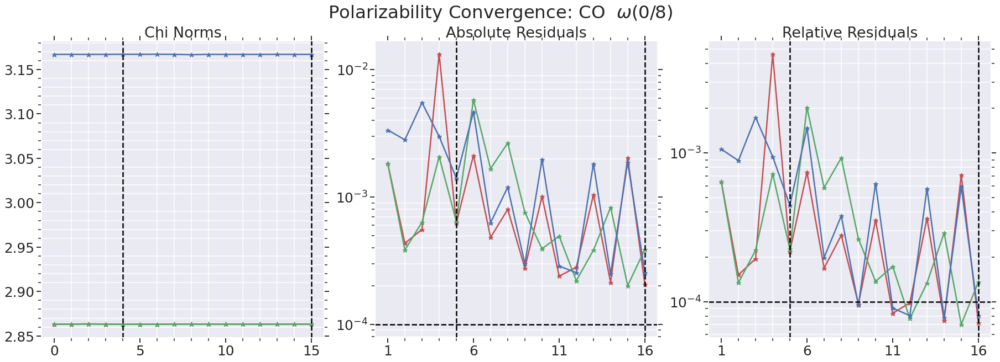

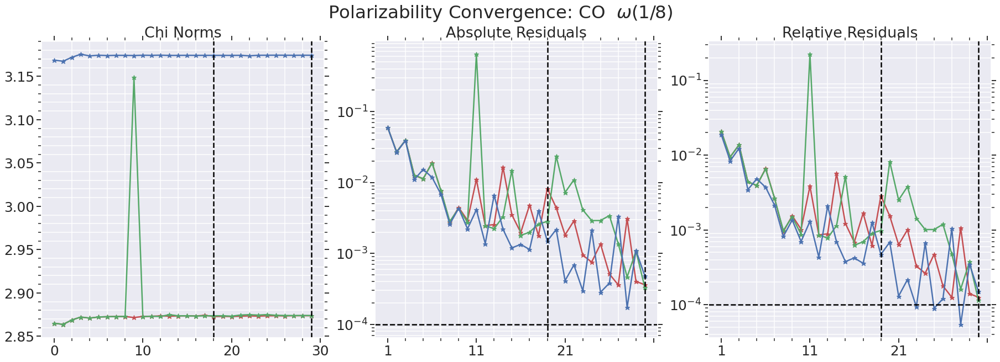

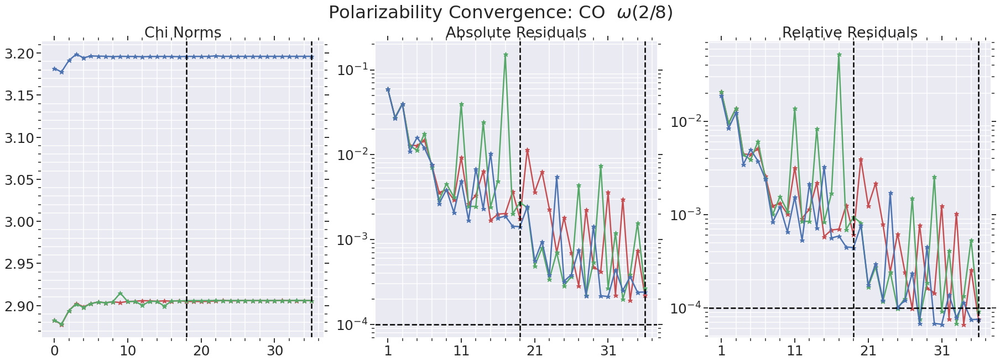

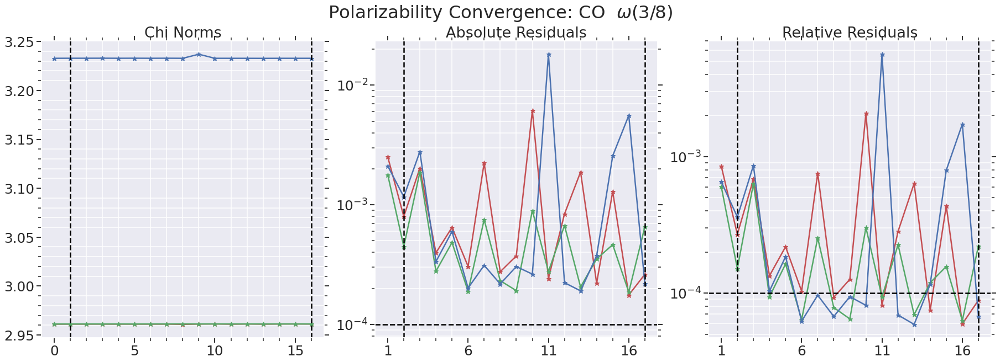

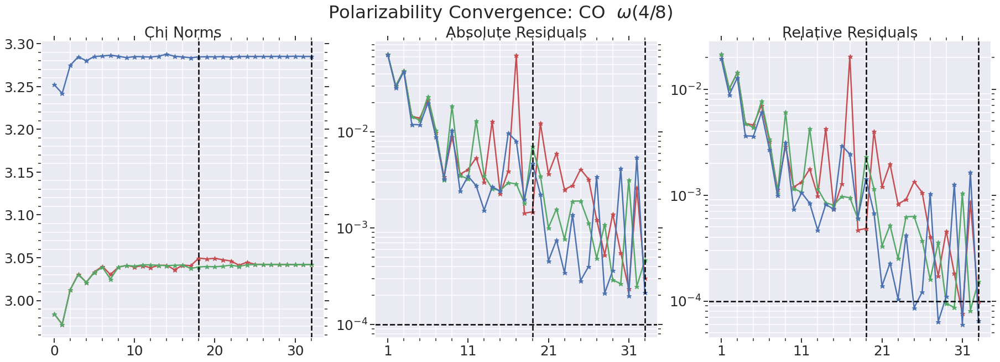

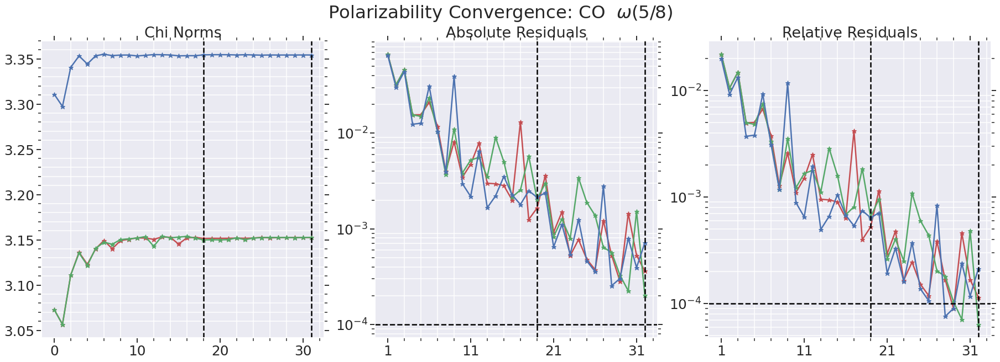

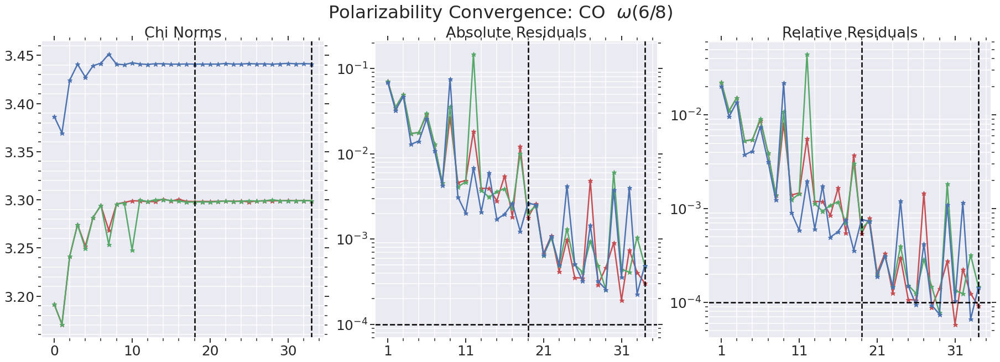

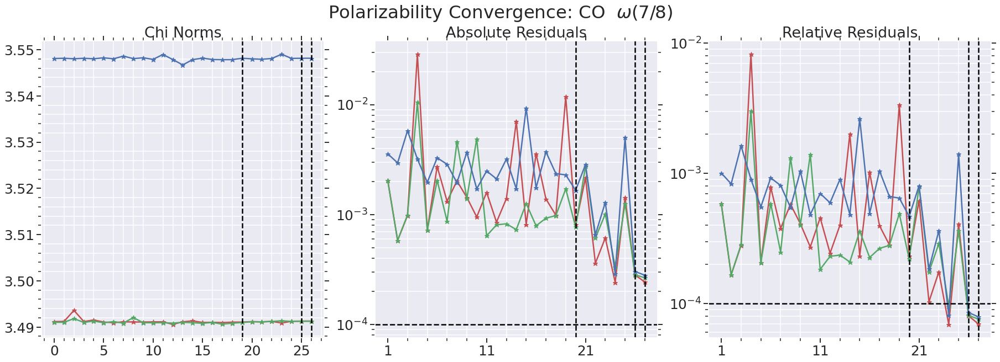

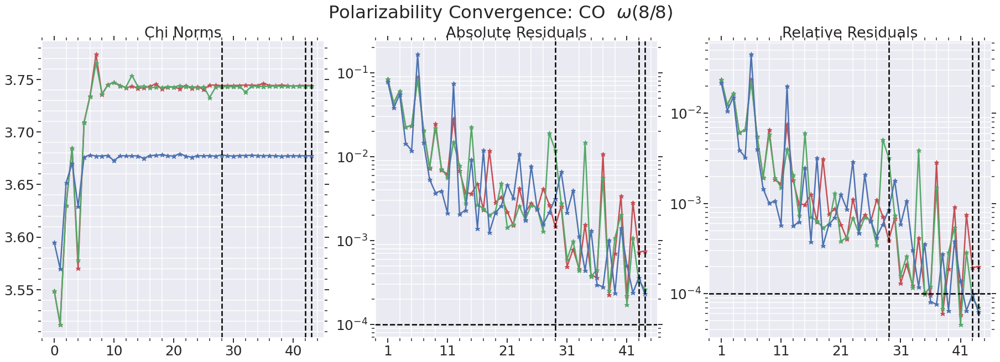

In [3]:
freq_norm_and_residual('CO','hf','dipole',False,data_dir)

# Basis Set Information

# Dunning type and Karlsruhe-type

- **cc-pVXZ**
    - Correlation consistent (cc)
    - Accurate ground-state energies for correlated methods
- **aug-cc-pVXZ**
    - Provides additional diffuse functions through augmentation
    - augmentation (aug)
- **d-aug-cc-pVXZ**
    - Furche and Rapport
    - optimized for response properties for DFT applications based on static polarizability calculations
    - (double augmented)
- **d-aug-cc-pCVXZ**
    - Polarized core (pC)
    - additional angular moment functions in the core electrons
    - AFAIK- Important for 1st and 2nd group elements where inner electrons are easily polarized
        - Na,Li,Mg
        
- **MRA** Multiresolution Multiwavelet basis
    - Functions represented on adaptive grid
    - Not optimized in any physical situtation but flexible enough to represent all physical situations
    - Optimal basis is constructed throughout the solution of the equations. 
        - Flexible for consistently accurate solution for all potentials and all molecules
    - Increase in accuracy comes at a cost
        - larger prefactor therfore slower for small molecules
    - Better scaling therefore large molecules should be possible wi
    
    
## Some additional basis-sets

- **aug-cc-pCTZ**
    -TZP Triple Zeta + Polarization + Tight Core + Diffuse



In [ ]:
# list all the basis-sets that we are using

basis_list=['aug-cc-pVDZ','aug-cc-pVTZ','aug-cc-pVQZ','aug-cc-pV5Z','aug-cc-pV6Z']
d_basis_list=['d-aug-cc-pVDZ','d-aug-cc-pVTZ','d-aug-cc-pVQZ','d-aug-cc-pV5Z','d-aug-cc-pV6Z']
pc_basis_list=['aug-cc-pCVDZ','aug-cc-pCVTZ','aug-cc-pCVQZ']
dpc_basis_list=['d-aug-cc-pCVDZ','d-aug-cc-pCVTZ','d-aug-cc-pCVQZ']
# dalton does not have these yet... perhaps I can add them
#pwcv_basis_list=['aug-cc-pCVDZ','aug-cc-pCVTZ','aug-cc-pCVQZ']

In [3]:
all_mols=[]
for g in glob.glob('molecules/*.mol'):
    m = g.split('/')
    mol = m[1].split('.')[0]
    all_mols.append(mol)
print(all_mols)       
print(len(all_mols))     


['CSO', 'LiH', 'FCN', 'P2H4', 'OCl2', 'LiH_s', 'SH2', 'Li2', 'NaCl', 'C2H2', 'BH3', 'HCONH2', 'CH3SH', 'P2', 'BH2Cl', 'NaCN', 'HCN', 'CH3OH', 'HBS', 'C2H4', 'SO2', 'HNC', 'Na2', 'F2', 'N2', 'SiH4', 'N2H2', 'CH3NH2', 'NH3O', 'HOF', 'He', 'HF', 'OF2', 'ClF', 'HCOOH', 'NH3', 'CH3Cl', 'Mg2', 'N2H4', 'Ne', 'HCHO', 'SiH3Cl', 'SF2', 'SiH3F', 'HOCl', 'HOOH', 'H2', 'HCl', 'HCCF', 'Mg', 'CH2BH', 'CH3BH2', 'BF', 'SiO', 'FNO', 'H2O', 'S2H2', 'LiCl', 'PH3O', 'Ar', 'BHF2', 'HNS', 'O3', 'HBO', 'Cl2', 'C6H6', 'NH2Cl', 'LiCN', 'CO', 'CS', 'LiBH4', 'CH4', 'BeH2', 'BH2F', 'CH2NH', 'CH3F', 'CO2', 'PH3', 'ClCN', 'HCHS', 'NaLi', 'SCl2', 'Be', 'NH2OH', 'HCCCl', 'NaH', 'NH2F', 'HNO', 'HCP', 'NOCl']
90


In [9]:
def polar_data_summary(mol,xc,op,compare_basis):
    
    d=display_convergence_plots(mol,xc,op,True )
    d=frequency_norm_plots(mol,xc,op,True )
    data=FrequencyData(mol,xc,op)
    gd,rd,md,dd=data.compare_dalton(compare_basis)
    #display('madness',md.round(4))
    #display(compare_basis,rd.round(4))
    display('[madness]-['+compare_basis+']',dd.round(4))
    avg_error=dd.loc[:,['xx','yy','zz']].mean(1)
    display('error in avg polarizability compared to:'+compare_basis,avg_error)
    return avg_error
def compare_basis(mol,xc,op,basis_list):
    data=FrequencyData(mol,xc,op)
    #display('madness',md.round(4))
    #display(compare_basis,rd.round(4))
    b_error={}
    for basis in basis_list:
        gd,rd,md,dd=data.compare_dalton(basis)
        avg_error=dd.loc[:,['xx','yy','zz']].mean(1)
        b_error[basis]=avg_error
    return pd.DataFrame(b_error)

def report_converged(mol_list,num_converged):
    converged=[]
    not_converged=[]
    not_found=[]
    type_error=[]
    json_error=[]
    for mol in mol_list:
        try:
            ben=FrequencyData(mol,'hf','dipole')
            if ben.converged.all() and ben.converged.sum()==num_converged:
                converged.append(mol)
            else:
                not_converged.append(mol)
        except FileNotFoundError as f:
            not_found.append(mol)
        except TypeError as f:
            type_error.append(mol)
        except json.decoder.JSONDecodeError as j:
            json_error.append(mol)
            
    num_c=len(converged)
    num_n=len(not_converged)
    num_nf=len(not_found)
    num_json_e=len(json_error)
    num_type_e=len(type_error)

    total=num_c+num_n+num_nf+num_json_e+num_type_e
    
    non_converged=[]
    part_converged=[]
    if True:
        for mol in not_converged:
            check=FrequencyData(mol,'hf','dipole')
            if(check.converged.any()):
                #print(mol,'\n',check.converged)
                part_converged.append(mol)
            else:
                non_converged.append(mol)
    num_not_converged=len(non_converged)
    num_part_converged=len(part_converged)
    
    print("converged : ",num_c)
    print("not converged : ",num_n)
    print("not found : ",num_nf)
    print("json error : ",num_json_e)
    print("type error : ",num_type_e)
    print("total : ",total)
    print("fully not converged",num_not_converged)
    print("num partly fully converged",num_part_converged )
    return converged,part_converged,non_converged,not_found,type_error,json_error

def get_walltime_data(mol,xc,operator):
    
    data=FrequencyData(mol,'hf','dipole')
    n_mo=data.calc_info['calcinfo_nalpha']
    g_time=data.calc_info['wall_time']
    wall_times=[]
    frequencies=[]
    for freq,base in data.response_base.items():
        frequencies.append(freq)
        wall_times.append(base['wall_time'])
        
    wall_array=np.array(wall_times)
    total_time=wall_array.sum()
    total_time+=g_time
    print(n_mo,' electrons, walltime: ',total_time)
    return n_mo, total_time

def get_wall_time_series(molecules,xc,operator):
    
    wall_time_data={}
    molecule_data={}
    for mol in molecules:
        n,time=get_walltime_data(mol,xc,operator)
        nkey=(n)
        if nkey not in wall_time_data:
            wall_time_data[nkey]=[]
            wall_time_data[nkey].append(time)
        else:
            wall_time_data[nkey].append(time)
        if nkey not in molecule_data:
            molecule_data[nkey]=[]
            molecule_data[nkey].append(mol)
        else:
            molecule_data[nkey].append(mol)
    wall_time_avg_data={}
    for n,time_list in wall_time_data.items():
        time_array=np.array(time_list)
        time_avg=time_array.sum()
        wall_time_avg_data[n]=time_avg
    time_series=pd.Series(wall_time_avg_data)
    mol_data=pd.Series(molecule_data)
    
    return time_series.sort_index(),mol_data.sort_index()

In [10]:
# comparing basis
def create_basis_mol_data(basis_list,mol_list,data_dict,num_freq):
    b_data={}
    idx=['Total HF Energy']
    for i in range(num_freq):
        idx.append(r'$\alpha(\omega_{})$'.format(i)) 
    for b in basis_list:
        diff_dict={}
        for mol in mol_list:
            diff_m=data_dict[mol]-data_dict[mol].loc['MRA']
            diff_dict[mol]=diff_m.loc[b]
            diff_dict[mol].index=idx
        pdm=pd.DataFrame(diff_dict)
        pdm.name=b
        b_data[b]=pdm.T
    return b_data

def mean_and_std(basis_list,mol_list,data_dict,num_freq):
    b_data=create_basis_mol_data(basis_list,mol_list,data_dict,num_freq)
    mean_d={}
    std_d={}
    for b in basis_list:
        mean_d[b]=b_data[b].mean()
        std_d[b]=b_data[b].std()
    p_mean=pd.DataFrame(mean_d)
    p_std=pd.DataFrame(std_d)
    return p_mean,p_std
    
def create_mol_basis_dict(basis_list,mol_list):
    data_dict={}
    for mol in mol_list:
        data,diff_data,energy_diff,polar_diff=create_data(mol,basis_list)
        data_dict[mol]=data
    return data_dict

def create_basis_set_df(basis_list,mol_list,num_freq):
    data_dict=create_mol_basis_dict(basis_list,mol_list)
    basis_dict=create_basis_mol_data(basis_list,mol_list,data_dict,num_freq)
    
    data_list=[]
    for b in basis_list:
        print(b)
        data=basis_dict[b]
        mols=list(data.index)
        num_mols=len(mols)
        basis_list_series=pd.Series([b for i in range(num_mols)])
        basis_list_series.index=data.index
        basis_list_series.name='basis'
        data_list.append(pd.concat([data,basis_list_series],axis=1))
        
    data_df=pd.concat(data_list)
    data_df.reset_index(inplace=True)
    data_df = data_df.rename(columns = {'index':'molecule'}) 
    return data_df



In [7]:
converged,part_converged,not_converged,not_found,type_error,json_error=report_converged(all_mols,9)

converged :  89
not converged :  1
not found :  0
json error :  0
type error :  0
total :  90
fully not converged 0
num partly fully converged 1


In [ ]:
blist=basis_list[0:3]
dlist=d_basis_list[0:3]
blist5=basis_list[0:4]
dlist5=d_basis_list[0:4]
print(blist5)
print(dlist5)
mol_list=converged[:]

HNS
 converged:  0.0                      True
0.001890125              True
0.00378025               True
0.005670375              True
0.0075605                True
0.009450625              True
0.01134075               True
0.013230875000000001     True
0.015121                False
dtype: bool


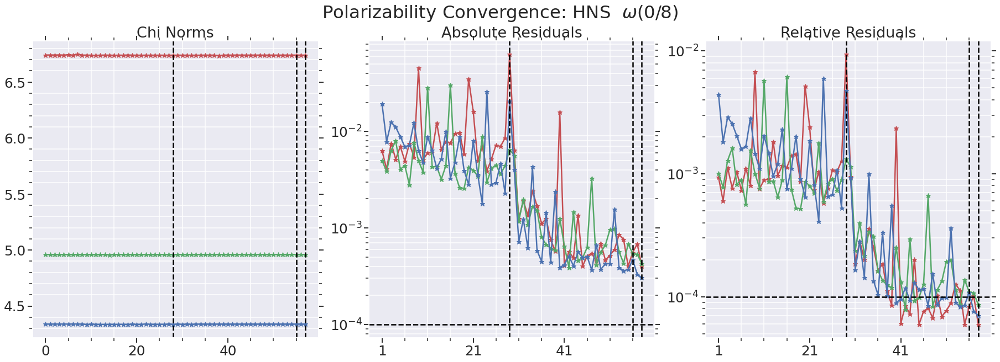

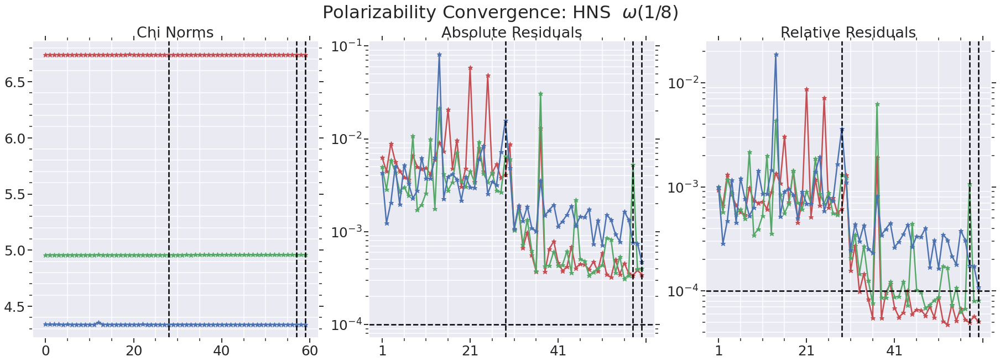

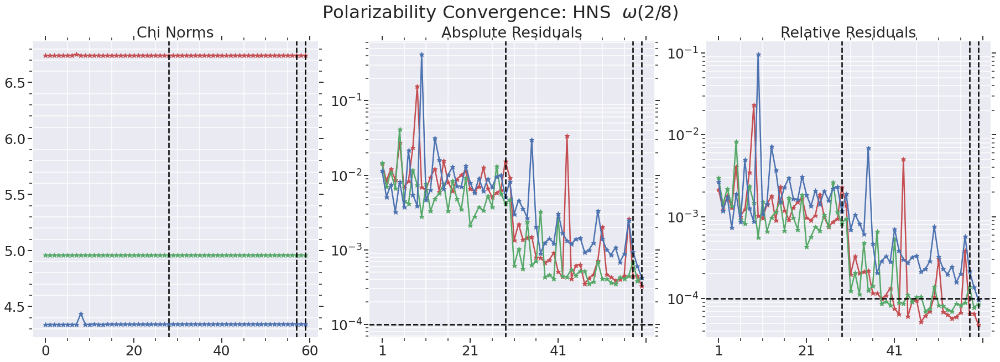

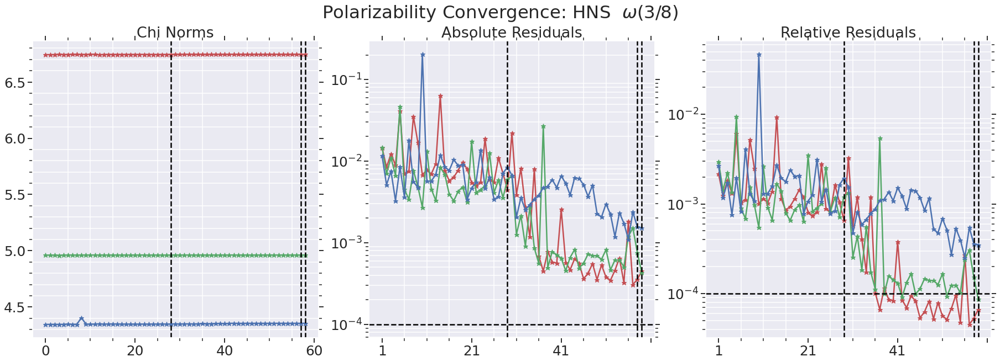

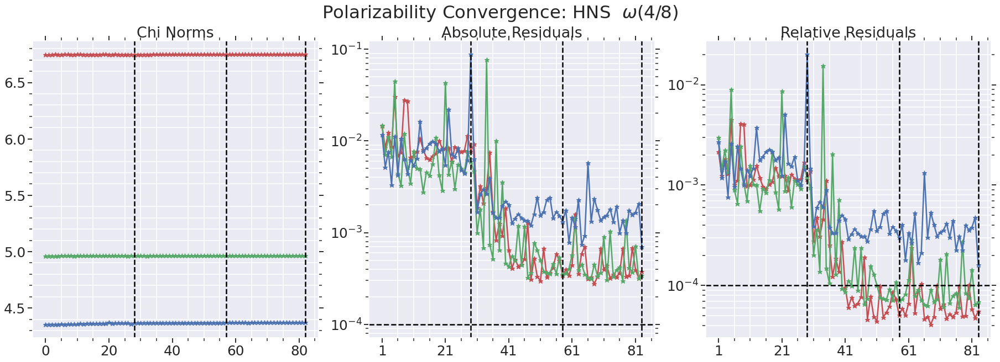

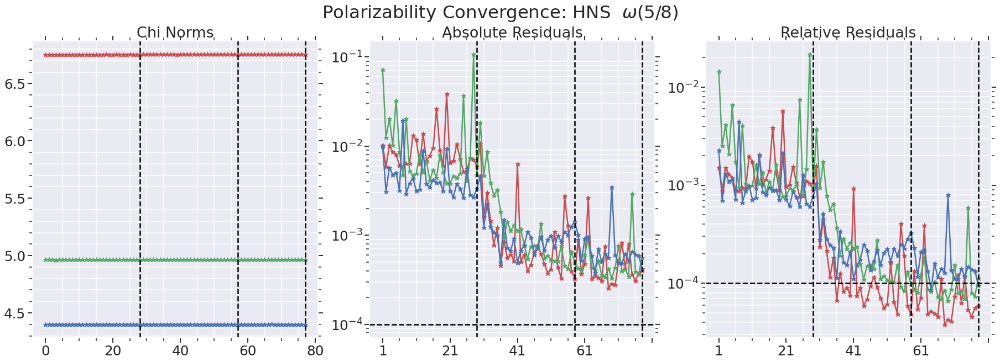

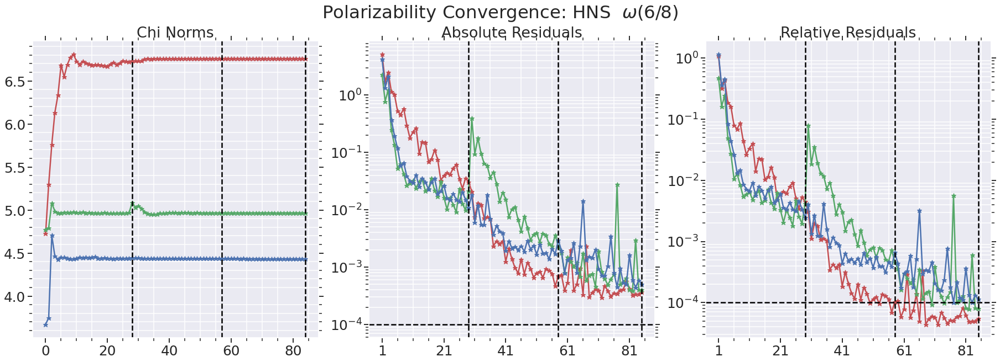

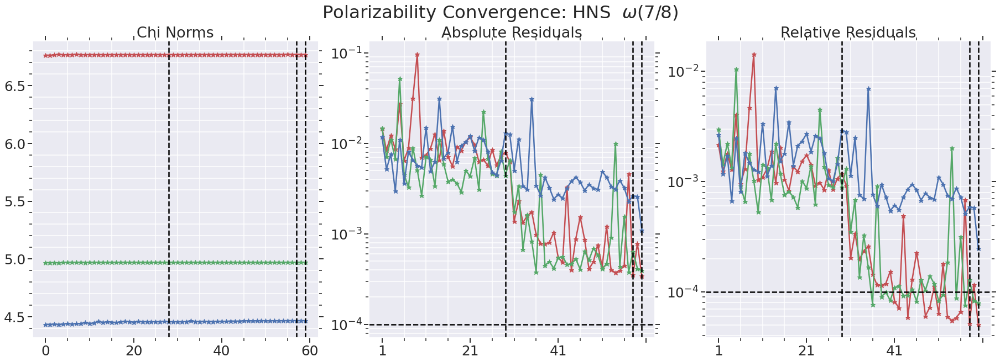

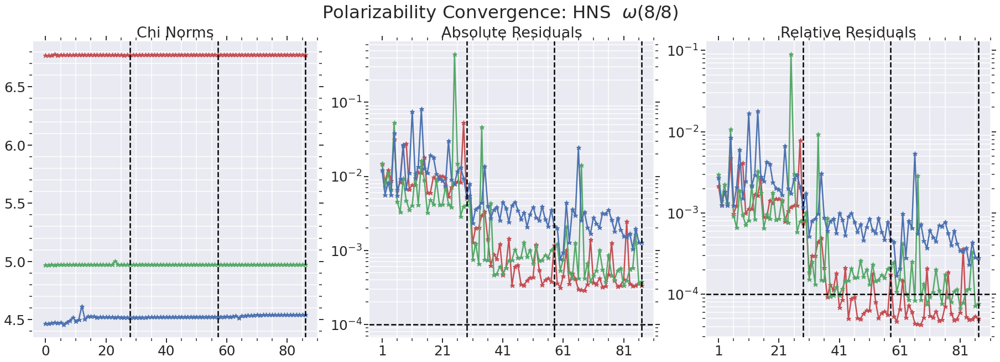

In [9]:
print("num converged: ",len(converged))
print("part converged: ",len(part_converged))
print("type_error",len(type_error))
print("type_error",type_error)

print("molecules not finshed:\n----------------------------\n",part_converged+type_error,'\n-------------------------------------')
running=['HNS','PH3O','SF2','NaCN','OCl2','HOOH','Cl2','P2H4','C6H6','SCl2']

restart=[f for f in part_converged+type_error  if f not in running]
print("molecules needing restart:\n----------------------------\n",restart,'\n-------------------------------------')
print("molecules needing restart:\n----------------------------\n",part_converged,'\n-------------------------------------')



num converged:  89
part converged:  1
type_error 0
type_error []
molecules not finshed:
----------------------------
 ['HNS'] 
-------------------------------------
molecules needing restart:
----------------------------
 [] 
-------------------------------------
molecules needing restart:
----------------------------
 ['HNS'] 
-------------------------------------


In [11]:
def create_data(mol, basis_list):
    res_dict = {
        "xx": "density_residualX",
        "yy": "density_residualY",
        "zz": "density_residualZ",
    }

    moldata = FrequencyData(mol, "hf", "dipole")
    xx = ["xx", "yy", "zz"]
    data = []
    for x in xx:
        data.append(create_polar_table(mol, "hf", basis_list, x))
    average = (data[0] + data[1] + data[2]) / 3

    diff_data = average - average.loc["MRA"]
    diff_data = diff_data.drop(index="MRA")

    polar_diff = diff_data.drop("Total HF Energy", axis=1)

    residuals = moldata.final_density_residuals()

    cleanX = residuals["density_residualX"].reset_index().drop("index", axis=1)
    cleanY = residuals["density_residualY"].reset_index().drop("index", axis=1)
    cleanZ = residuals["density_residualZ"].reset_index().drop("index", axis=1)

    cleanX.rename(columns={"density_residualX": "MRA density residual"}, inplace=True)
    cleanY.rename(columns={"density_residualY": "MRA density residual"}, inplace=True)
    cleanZ.rename(columns={"density_residualZ": "MRA density residual"}, inplace=True)
    clean = (cleanX + cleanY + cleanZ) / 3
    clean.index = polar_diff.T.index

    average = pd.concat([average, clean.T])

    average.name = "Average Polarizability"

    energy_diff = diff_data["Total HF Energy"]
    return average, diff_data, energy_diff, polar_diff
def create_polar_diff_plot(mol, basis_list):
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(14,10),constrained_layout=True)
    title = 'Polarizability Convergence: ' + mol
    yl = r" $\Delta\alpha=\alpha($BASIS$) -\alpha($MRA$)$" 
    
    data, diff_data, energy_diff, polar_diff = create_data(mol, basis_list)
    num_freq = len(list(polar_diff.keys()))
    
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    polar_diff.iloc[:, :].plot(marker="v", linestyle="solid", markersize=12, linewidth=4, colormap='magma',ax=ax)
    legend = []
    for i in range(num_freq):
        legend.append(r'$\omega_{}$'.format(i))

    plt.axhline(linewidth=2, ls="--", color="k")
    plt.legend(legend)
    plt.xticks(rotation=20)
    plt.title(title)
    plt.ylabel(yl)
    btitle = basis_list[0].replace('D', 'X')
    save = mol + "-" + btitle
    if not os.path.exists("figures"):
        os.mkdir("figures")
    if not os.path.exists("tables"):
        os.mkdir("tables")
    save = "figures/" + save + ".svg"
    fig.savefig(save)

    latex_save = mol + "-" + btitle
    latex_save = "tables/" + latex_save + ".tex"
    data = data.round(decimals=4)
    data.style.to_latex(latex_save)

    return 

In [ ]:
def polar_plot(mol,basis_list,ax):
    
    data, diff_data, energy_diff, polar_diff = create_data(mol, basis_list)
    num_freq = len(list(polar_diff.keys()))
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    btitle = basis_list[0].replace('D', 'X')
    
    polar_diff.iloc[:, :].plot(marker="v", linestyle="solid", markersize=12, linewidth=4,
                               colormap='magma',ax=ax,title=btitle)
    
    legend = []
    for i in range(num_freq):
        legend.append(r'$\omega_{}$'.format(i))
        

    ax.axhline(linewidth=2, ls="--", color="k")
    ax.legend(legend)
    #ax.set_xticks(rotation=20)
    yl = r" $\Delta\alpha=[\alpha($BASIS$) -\alpha($MRA$)]$" 
    ax.set_ylabel(yl)
    ax.set_xlabel(ax.get_xlabel(),rotation=45)
    
    
    
def create_polar_diff_subplot(mol,blist,dlist):
    
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(25,9),constrained_layout=True)
    title = 'Polarizability Convergence: ' + mol
    fig.suptitle(title)
    
    polar_plot(mol,blist,ax[0])
    polar_plot(mol,dlist,ax[1])
    
    btitle = basis_list[0].replace('D', 'X')
    save = mol + "-" + btitle
    if not os.path.exists("acs_mols"):
        os.mkdir("acs_mols")
    save = "acs_mols/" + save + ".svg"
    fig.savefig(save)
    return fig

    
    


In [ ]:
dz5_mol=[]
for mol in converged:
    try:
        f=create_polar_diff_subplot(mol,blist5,dlist5)
        dz5_mol.append(mol)
    except:
        pass
        f=create_polar_diff_subplot(mol,blist,dlist)
        
    #display_convergence_plots(mol,'hf','dipole',True)
    #frequency_norm_plots(mol,'hf','dipole',True)

In [ ]:
pc_mols=[]
for mol in converged:
    try:
        f=create_polar_diff_subplot(mol,pc_basis_list,dpc_basis_list)
        pc_mols.append(mol)
    except:
        pass

[Errno 2] No such file or directory: '/home/adrianhurtado/testing/post_watoc/august/../dalton/hf/P2H4/dipole/freq_P2H4-d-aug-cc-pCVQZ.out'
Try and run molecule  P2H4
mpirun -n 2 dalton freq.dal P2H4-d-aug-cc-pCVQZ.mol


,aug-cc-pVDZ,aug-cc-pVTZ,aug-cc-pVQZ,MRA
Frequency,,,,
0.0,19.519991,19.506696,19.410758,19.409348
0.016219125,19.551087,19.537937,19.441825,19.440572
0.03243825,19.645031,19.632324,19.535685,19.534451
0.048657375,19.803825,19.791884,19.694362,19.693160
0.0648765,20.030932,20.020124,19.921353,19.920235
0.081095625,20.331477,20.322238,20.221842,20.219515
0.09731475,20.712560,20.705429,20.603017,20.604447
0.113533875,21.183727,21.179383,21.074555,21.074043
0.129753,21.757645,21.756971,21.649320,21.650428


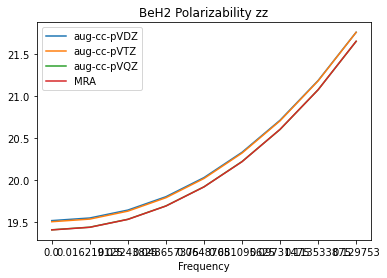

In [21]:
d=FrequencyData('BeH2','hf','dipole')
d.compare_polar_basis_list('zz',basis_list[0:3])

In [20]:
print(len(all_mols),' '.join(all_mols))
print(len(converged),' '.join(converged))
print(len(pc_mols),' '.join(pc_mols))
print(len(dz5_mol),' '.join(pc_mols))
print(' '.join(converged))
all_mols
pc_mols
dz5_mol

90 CSO LiH FCN P2H4 OCl2 LiH_s SH2 Li2 NaCl C2H2 BH3 HCONH2 CH3SH P2 BH2Cl NaCN HCN CH3OH HBS C2H4 SO2 HNC Na2 F2 N2 SiH4 N2H2 CH3NH2 NH3O HOF He HF OF2 ClF HCOOH NH3 CH3Cl Mg2 N2H4 Ne HCHO SiH3Cl SF2 SiH3F HOCl HOOH H2 HCl HCCF Mg CH2BH CH3BH2 BF SiO FNO H2O S2H2 LiCl PH3O Ar BHF2 HNS O3 HBO Cl2 C6H6 NH2Cl LiCN CO CS LiBH4 CH4 BeH2 BH2F CH2NH CH3F CO2 PH3 ClCN HCHS NaLi SCl2 Be NH2OH HCCCl NaH NH2F HNO HCP NOCl
87 CSO LiH FCN P2H4 OCl2 LiH_s SH2 Li2 NaCl C2H2 BH3 HCONH2 CH3SH P2 BH2Cl NaCN HCN CH3OH HBS C2H4 SO2 HNC Na2 F2 N2 SiH4 N2H2 CH3NH2 NH3O HOF He HF OF2 ClF HCOOH NH3 CH3Cl Mg2 N2H4 Ne HCHO SiH3Cl SF2 SiH3F HOCl HOOH H2 HCl HCCF Mg CH2BH CH3BH2 BF SiO FNO H2O S2H2 LiCl PH3O Ar BHF2 O3 HBO Cl2 C6H6 LiCN CO CS LiBH4 CH4 BeH2 BH2F CH2NH CH3F CO2 PH3 ClCN HCHS NaLi Be NH2OH HCCCl NaH NH2F HNO HCP NOCl
70 CSO LiH FCN LiH_s SH2 Li2 NaCl C2H2 BH3 P2 BH2Cl HCN CH3OH HBS C2H4 SO2 HNC Na2 F2 N2 SiH4 N2H2 HOF He HF OF2 ClF NH3 CH3Cl Mg2 HCHO SF2 SiH3F HOCl H2 HCl HCCF Mg CH2BH BF SiO FNO 

['OCl2',
 'SH2',
 'C2H2',
 'P2',
 'HCN',
 'CH3OH',
 'HBS',
 'C2H4',
 'SO2',
 'HNC',
 'F2',
 'N2',
 'SiH4',
 'N2H2',
 'He',
 'OF2',
 'ClF',
 'HCOOH',
 'CH3Cl',
 'Ne',
 'HCHO',
 'SiH3Cl',
 'SiH3F',
 'HOOH',
 'H2',
 'HCl',
 'CH2BH',
 'SiO',
 'FNO',
 'H2O',
 'S2H2',
 'Ar',
 'BHF2',
 'O3',
 'Cl2',
 'CO',
 'CS',
 'CH4',
 'CO2',
 'PH3',
 'HCHS',
 'NH2F',
 'HNO',
 'HCP',
 'NOCl']

In [21]:
data1=create_basis_set_df(blist+dlist,converged,9)
data2=create_basis_set_df(blist+dlist+pc_basis_list+dpc_basis_list,pc_mols,9)
data3=create_basis_set_df(blist5+dlist5,dz5_mol,9)

aug-cc-pVDZ
aug-cc-pVTZ
aug-cc-pVQZ
d-aug-cc-pVDZ
d-aug-cc-pVTZ
d-aug-cc-pVQZ
aug-cc-pVDZ
aug-cc-pVTZ
aug-cc-pVQZ
d-aug-cc-pVDZ
d-aug-cc-pVTZ
d-aug-cc-pVQZ
aug-cc-pCVDZ
aug-cc-pCVTZ
aug-cc-pCVQZ
d-aug-cc-pCVDZ
d-aug-cc-pCVTZ
d-aug-cc-pCVQZ
aug-cc-pVDZ
aug-cc-pVTZ
aug-cc-pVQZ
aug-cc-pV5Z
d-aug-cc-pVDZ
d-aug-cc-pVTZ
d-aug-cc-pVQZ
d-aug-cc-pV5Z


In [22]:
data_keys=list(data1.keys())

def find_outlier(data,dtype,basis,cutoff):
    aqz=data.loc[data['basis']==basis]
    

    outlier_df=aqz.loc[aqz.loc[:,dtype].abs()>cutoff]
    outlier_list=list(outlier_df.loc[:,'molecule'])
    
    out_idx=data.molecule.isin(outlier_list)
    
    keep=data.loc[~out_idx,:]  
    remove=data.loc[out_idx,:]  
    
    return keep,remove

# Finding outliers

We choose the largest basis-set of the dataset and remove molecules with absolute error greater than threshold. 

In dataset including **aug**-cc-pVXZ and **d-aug**-cc-pVXZ results the molecules with an absolute error > .15 in the spherically averaged static polarizability where, 

- ['NaCl', 'Na2', 'Mg2', 'Mg', 'NaLi', 'NaH']

All first and second elements.



In [23]:
print(data_keys)
dtype=data_keys[2]
# given a dataset remove outlier molecules with absolute error greater than d-aug-cc-pVQZ compared to MRA
data1_keep,data_1removed=find_outlier(data1,dtype,'d-aug-cc-pVQZ',.15)
outlier_molecules=list(data_1removed.molecule.unique())
print(outlier_molecules)
#outlier_df.index
#aqz.iloc[:,0]

    

['molecule', 'Total HF Energy', '$\\alpha(\\omega_0)$', '$\\alpha(\\omega_1)$', '$\\alpha(\\omega_2)$', '$\\alpha(\\omega_3)$', '$\\alpha(\\omega_4)$', '$\\alpha(\\omega_5)$', '$\\alpha(\\omega_6)$', '$\\alpha(\\omega_7)$', '$\\alpha(\\omega_8)$', 'basis']
['NaCl', 'NaCN', 'Na2', 'Mg2', 'Mg', 'NaLi', 'NaH']


In [37]:
print(len(converged))
print(len(converged)-7)
print(len(pc_mols))
print(len(dz5_mol))


85
78
70
44


In [1]:
def seperate_augmentation(data,blist,dlist):
    
    d1=data.loc[data.basis.isin(blist)]# not augmented
    num_data=len(list(d1.index))
    d2=data.loc[data.basis.isin(dlist)]# augmented
    
    daug=[True for i in range(num_data)]
    aug_true=pd.Series(daug)
    aug_true.index=d2.index
    aug_true.name='d-aug'
    
    aug_false=~aug_true
    aug_false.index=d1.index
    aug_false.name='d-aug'
    
    base_vals=d1.loc[:,'basis'].values
    d2.loc[:,'basis']=base_vals
    
    d2=pd.concat([d2,aug_true],axis=1)
    d1=pd.concat([d1,aug_false],axis=1)
    
    return pd.concat([d1,d2])

def augmentation_violin_plot(data,data_id,ax):
    
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    p1=sns.violinplot(x=data['basis'],y=data[data_id],hue=data['d-aug']
                      ,ax=ax,split=True,scale="count",inner='quartile',scale_hue=False)
    p11=sns.swarmplot(x=data['basis'],y=data[data_id],hue=data['d-aug'],ax=ax,size=5.0,dodge=True,color='.2')
    
    ax.axhline(y=0,linewidth=2, ls="--", color="r")
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2],['aug-cc-pVXZ','d-aug-cc-pVXZ'])
    ax.set_title(data_id ,fontsize=30)
    
    ax.set_xlabel('Basis',fontsize=28)
    ax.set_ylabel(r'$\Delta$'+data_id+' : [(basis) - (MRA)]',fontsize=28)
    nblist=len(list(data['basis'].unique()))
    xticks=[i for i in range(nblist)]
    labels=['D','T','Q','5','6']
    ax.set_xticks(xticks,labels=labels[0:nblist],fontsize=24)

def augmentation_series_violin_plots(data,blist,dlist):
    compare_data=seperate_augmentation(data,blist,dlist)
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(18,12),constrained_layout=True)
    augmentation_violin_plot(compare_data,data_keys[1],ax[0])
    augmentation_violin_plot(compare_data,data_keys[2],ax[1])
    #augmentation_violin_plot(compare_data,data_keys[10],ax[2])
    
    b1=blist[-1].replace('Q','X')
    b2=dlist[-1].replace('Q','X')
    fig.suptitle('Comparing '+b1+ ' and '+ b2)
    return fig

def seperate_polarization(data,blist,dlist):
    ## seperate based on polarized vs not.... both will be d-aug-cc-p()VXZ simply C or not
    
    d1=data.loc[data.basis.isin(blist)]# not augmented
    num_data=len(list(d1.index))
    d2=data.loc[data.basis.isin(dlist)]# augmented
    
    daug=[True for i in range(num_data)]
    aug_true=pd.Series(daug)
    aug_true.index=d2.index
    aug_true.name='polarized'
    
    aug_false=~aug_true
    aug_false.index=d1.index
    aug_false.name='polarized'
    
    base_vals=d1.loc[:,'basis'].values
    d2.loc[:,'basis']=base_vals
    
    d2=pd.concat([d2,aug_true],axis=1)
    d1=pd.concat([d1,aug_false],axis=1)
    
    return pd.concat([d1,d2])

def polarization_violin_plot(data,data_id,ax):
    
    blist=list(data.basis.unique())
    
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    p1=sns.violinplot(x=data['basis'],y=data[data_id],hue=data['polarized']
                      ,ax=ax,split=True,scale="count",inner='quartile',scale_hue=False)
    p11=sns.swarmplot(x=data['basis'],y=data[data_id],hue=data['polarized'],ax=ax,size=5.0,dodge=True,color='.2')
    
    handles, labels = ax.get_legend_handles_labels()
    if blist[0]=='aug-cc-pVDZ':
        ax.legend(handles[:2],['aug-cc-pVXZ','aug-cc-pCVXZ']) 
    elif blist[0]=='d-aug-cc-pVDZ':
        ax.legend(handles[:2],['d-aug-cc-pVXZ','d-aug-cc-pCVXZ']) 
            
    ax.axhline(y=0,linewidth=2, ls="--", color="r")
    ax.set_title(data_id ,fontsize=30)
    
    ax.set_xlabel('Basis',fontsize=28)
    ax.set_ylabel(r'$\Delta$'+data_id+' : [(basis) - (MRA)]',fontsize=28)
    nblist=len(list(data['basis'].unique()))
    xticks=[i for i in range(nblist)]
    labels=['D','T','Q','5','6']
    ax.set_xticks(xticks,labels=labels[0:nblist],fontsize=24)

def polarization_series_violin_plots(data,blist,dlist):
    compare_data=seperate_polarization(data,blist,dlist)
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(18,12),constrained_layout=True)
    polarization_violin_plot(compare_data,data_keys[1],ax[0])
    polarization_violin_plot(compare_data,data_keys[2],ax[1])
    #polarization_violin_plot(compare_data,data_keys[10],ax[2])
    
    b1=blist[-1].replace('Q','X')
    b2=dlist[-1].replace('Q','X')
    fig.suptitle('Comparing '+b1+ ' and '+ b2)
    return fig

def plot_bar(data,basis,data_id,ax):
    data=data.loc[data['basis']==basis].sort_values(data_id)
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    if data_id==data_keys[1]:
        diverging_colors=sns.color_palette('Blues',len(data))
    else:
        diverging_colors=sns.color_palette('RdBu',len(data))
    sns.barplot(x=data.molecule.values,y=data[data_id],palette=diverging_colors,ax=ax)
    ax.set_xticklabels(labels=data.molecule,rotation=90,fontsize=16)
    ax.set_ylabel(r'$\Delta$'+data_id+r'$=\alpha($'+basis +r'$) - \alpha(MRA)$')
    ax.set_title('Error: ' +data_id+' : '+basis)
# and clears it if it already exists.


def compare_bar_plots(data,b1,b2,data_id):
    
    fig, ax = plt.subplots(nrows=2,ncols=1,figsize=(15,15),constrained_layout=True)
    
    plot_bar(data,b1,data_id,ax[0])
    plot_bar(data,b2,data_id,ax[1])
    fig.suptitle('Comparison between '+b1 + ' and '+ b2)
    
    return fig

def single_bar_plots(data,b1,data_id,redline):
    
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(15,10),constrained_layout=True)
    ax.axhline(y=redline,linewidth=2, ls="--", color="r")
    ax.axhline(y=-redline,linewidth=2, ls="--", color="r")
    
    plot_bar(data,b1,data_id,ax)
    #fig.suptitle('Comparison between '+b1 + ' and '+ b2)
    
    return fig
    #ax.legend(['aug-cc-pVXZ','d-aug-cc-pVXZ'],fontsize=24)
    

def series_compare_violin_plot(data,data_id,ax,dtitle):
    
    
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    p1=sns.violinplot(x=data['basis'],y=data[data_id],hue=data['d-aug']
                      ,ax=ax,split=True,scale="count",inner='quartile',scale_hue=False,palette='pastel')
    p11=sns.swarmplot(x=data['basis'],y=data[data_id],hue=data['d-aug'],ax=ax,size=5.0,dodge=True,color='.2')
    
    ax.axhline(y=0,linewidth=2, ls="--", color="r")
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2],['aug-cc-pVXZ','d-aug-cc-pVXZ'])
    ax.set_title(data_id+' : '+dtitle ,fontsize=30)
    
    ax.set_xlabel('Basis',fontsize=28)
    ax.set_ylabel(r'$\Delta$'+data_id+' : [(basis) - (MRA)]',fontsize=28)
    
    
    ax.set_xlabel('Basis',fontsize=28)
    ax.set_ylabel(r'$\Delta$'+data_id+' : [(basis) - (MRA)]',fontsize=28)
    nblist=len(list(data['basis'].unique()))
    xticks=[i for i in range(nblist)]
    labels=['D','T','Q','5','6']
    ax.set_xticks(xticks,labels=labels[0:nblist],fontsize=24)
    
def compare_series_violin_plots(data1,data2,data_id,blist,dlist,dtitle1,dtitle2):
    compare_data1=seperate_augmentation(data1,blist,dlist)
    compare_data2=seperate_augmentation(data2,blist,dlist)
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(20,11),constrained_layout=True)
    
    series_compare_violin_plot(compare_data1,data_id,ax[0],dtitle1)
    series_compare_violin_plot(compare_data2,data_id,ax[1],dtitle2)
    
    #fig.suptitle('Removing Outliers')
    return fig


In [2]:
f1=augmentation_series_violin_plots(data1,blist,dlist)
f1.savefig('acs_plots_new/violin-aug_vs_daug.svg')


NameError: name 'data1' is not defined

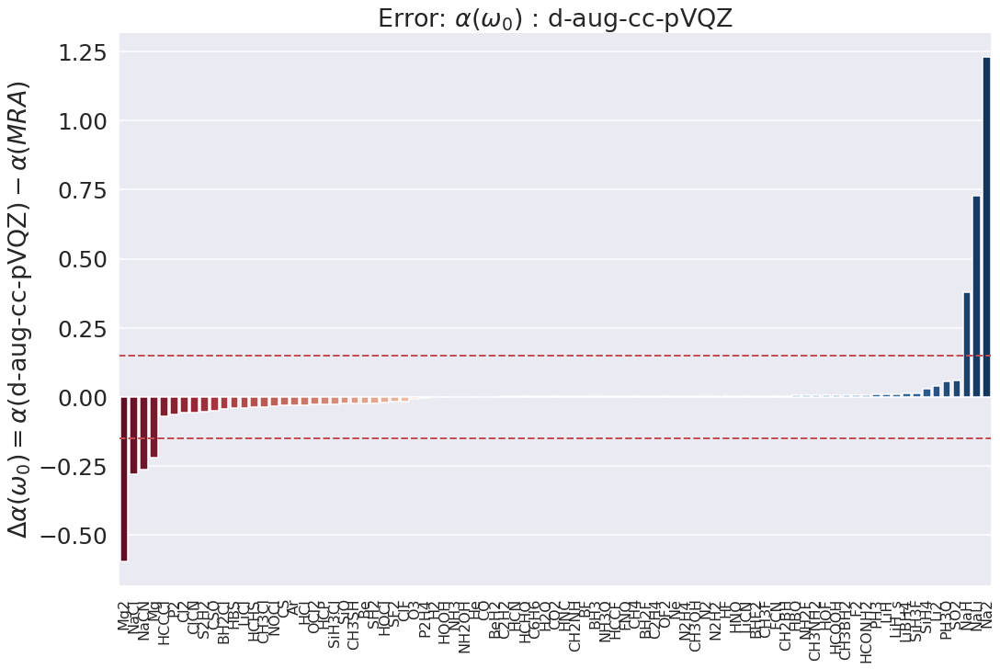

In [28]:
bar_aug=single_bar_plots(data1,'d-aug-cc-pVQZ',data_keys[2],.15)
bar_aug.savefig('acs_plots_new/bar_pvqz.svg')

/tmp/ipykernel_164789/426774053.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2.loc[:,'basis']=base_vals
/tmp/ipykernel_164789/426774053.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2.loc[:,'basis']=base_vals
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 14.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/sit

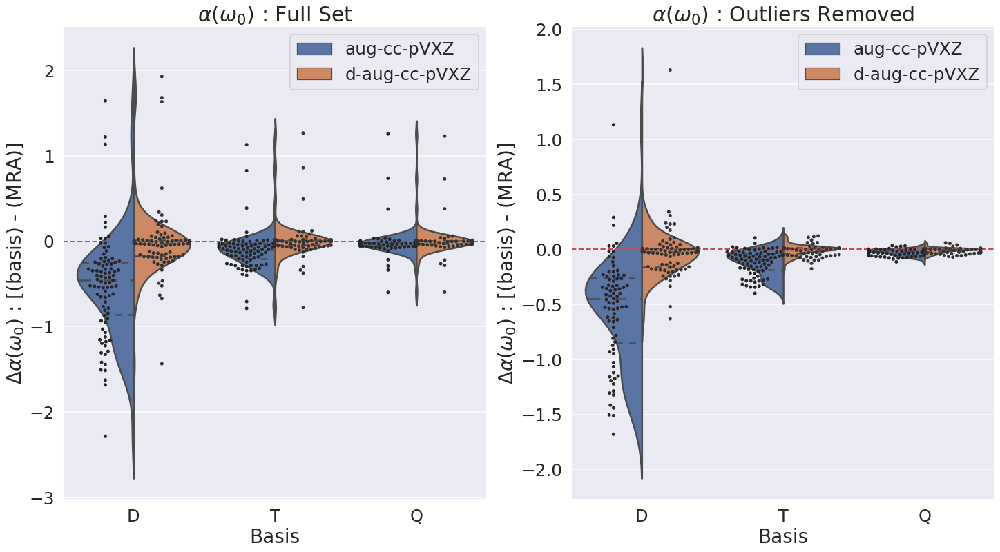

In [29]:
f1=compare_series_violin_plots(data1,data1_keep,data_keys[2],blist,dlist,'Full Set','Outliers Removed')
f1.savefig('acs_plots_new/violin_outliers_removed.svg')

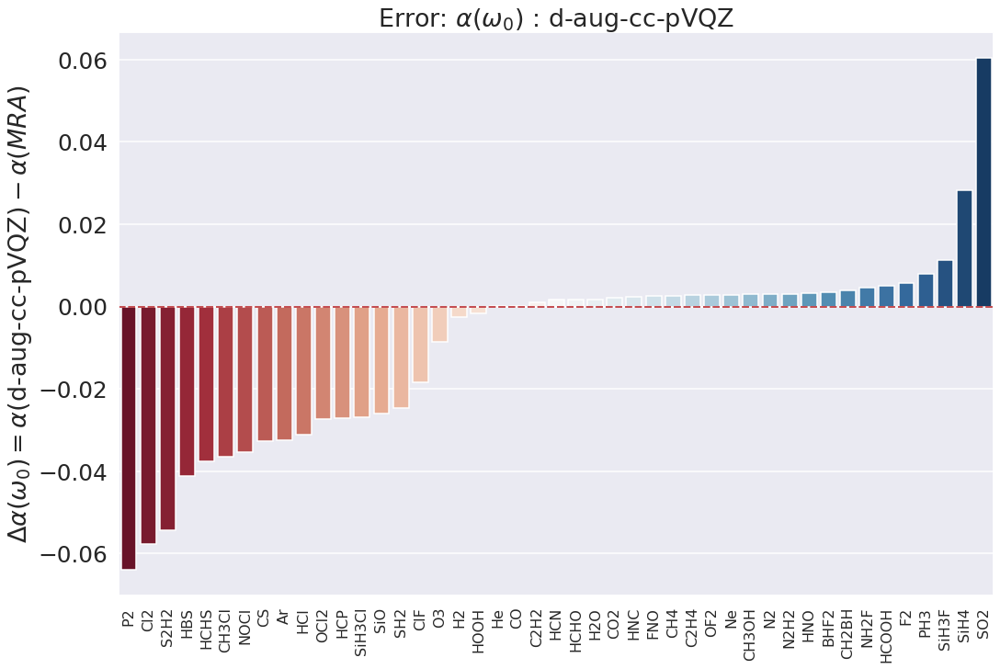

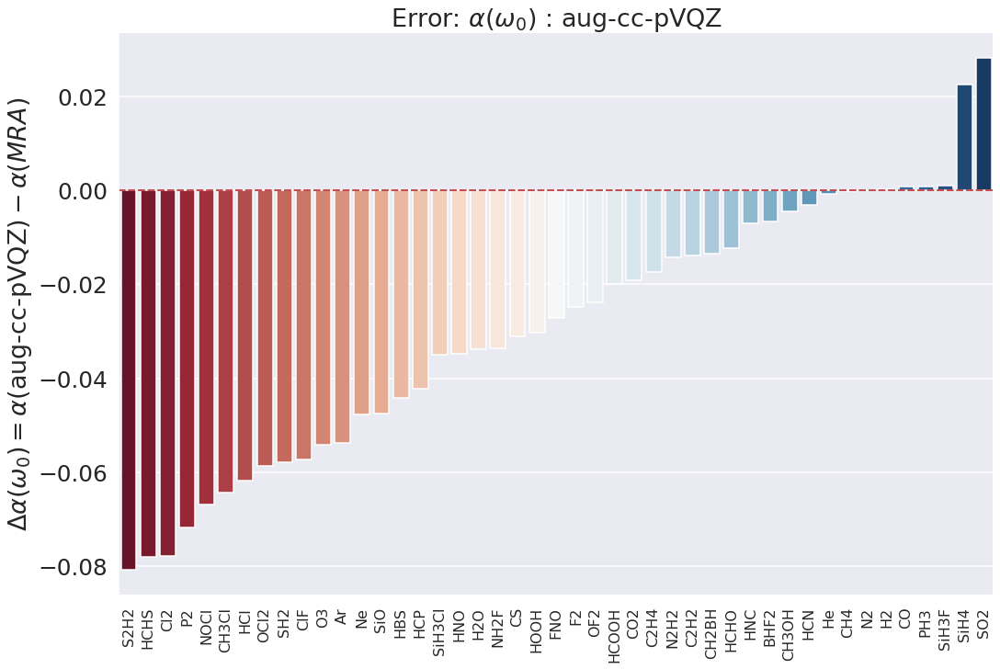

In [30]:

bar_aug5=single_bar_plots(data3,'d-aug-cc-pVQZ',data_keys[2],0)
bar_aug5.savefig('acs_plots_new/bar_dpv5z.svg')

bar_aug5=single_bar_plots(data3,'aug-cc-pVQZ',data_keys[2],0)
bar_aug5.savefig('acs_plots_new/bar_pv5z.svg')

I just listened to the very nice talk given by Adrian Hurtado at the ACS fall meeting discussing your recent work in studying the basis set convergence of polarizabilities. It was great to see you generating reference data for molecular polarizabilities at the basis set limit. I've done similar work in atoms a few years ago, using numerical HF calculations on a real-space grid as a reference. The publication is here, in case you are interested:
Rappoport, D. (2011), Basis-Set Quality and Basis-Set Bias in Molecular Property Calculations. ChemPhysChem, 12: 3404-3413. https://doi.org/10.1002/cphc.201100502

In particular, I've also observed the peculiar effect of double diffuse augmentation on small orbital basis sets such cc-pVDZ, which leads to polarizabilities above the basis set limit. I was able to explain this result in terms of the basis set effect on the ground-state HF wave function, which acquires contributions from excited electronic states due to a disbalance between the valence and diffuse segments of the basis sets.The contributions are very small and have virtually no effect on the HF ground-state energy but can be seen by considering the principal angles between the basis sets and the occupied and Rydberg atomic orbitals, respectively. I hope  this result might be useful to you as well.

Best regards,
Dmitrij

/tmp/ipykernel_164789/1603530057.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(25,9),constrained_layout=True)


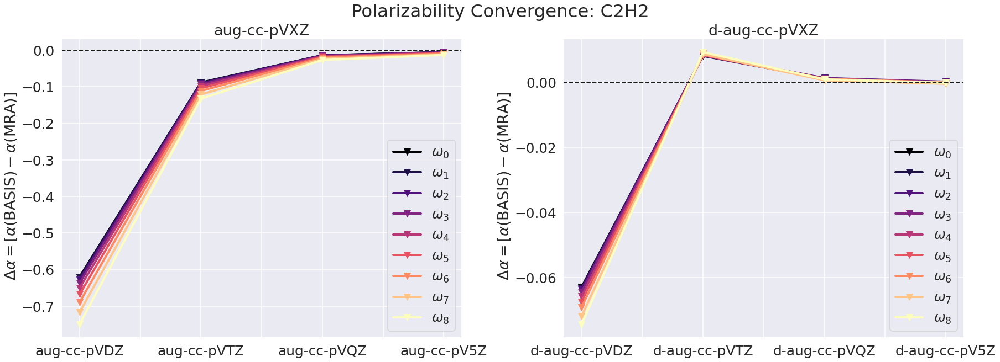

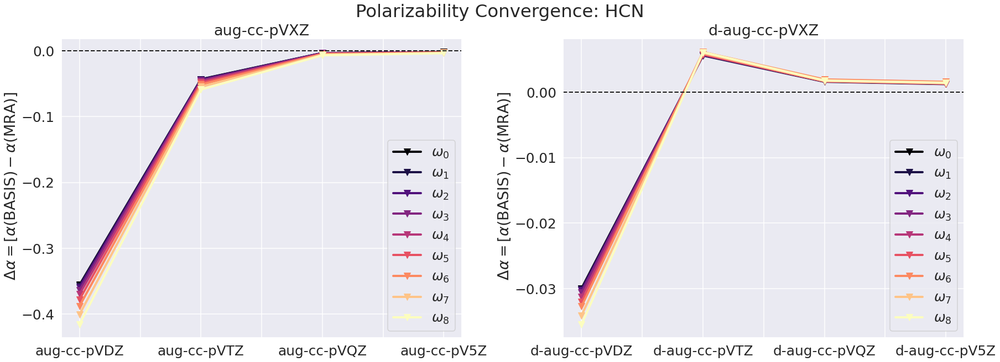

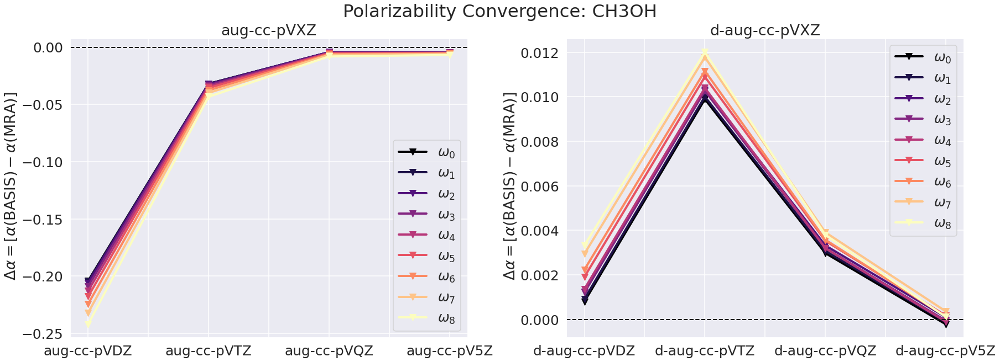

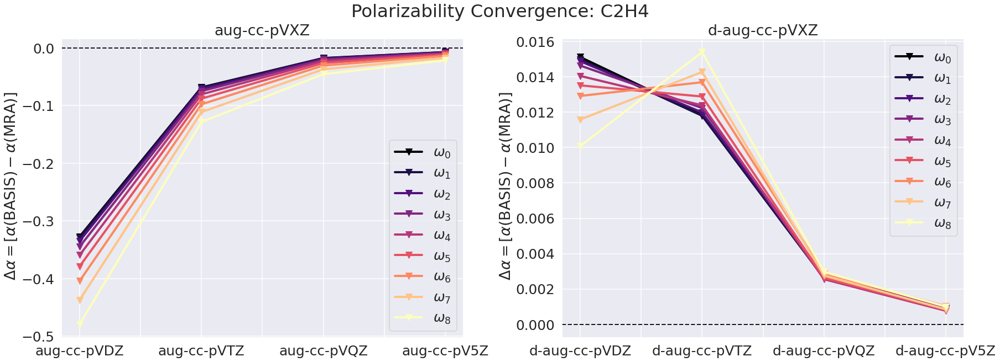

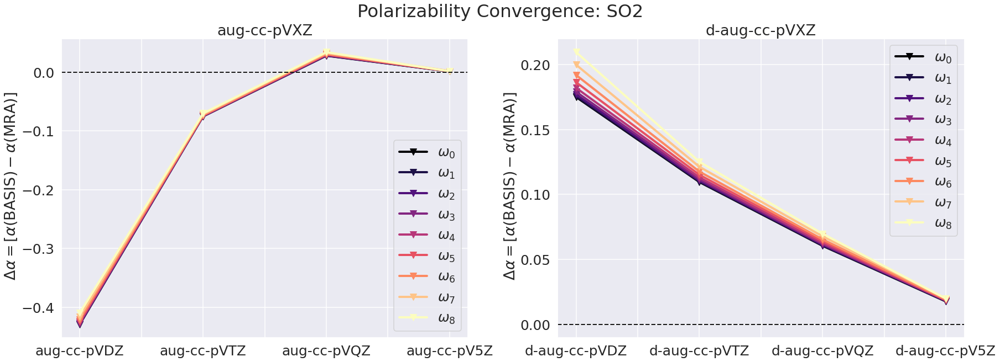

...

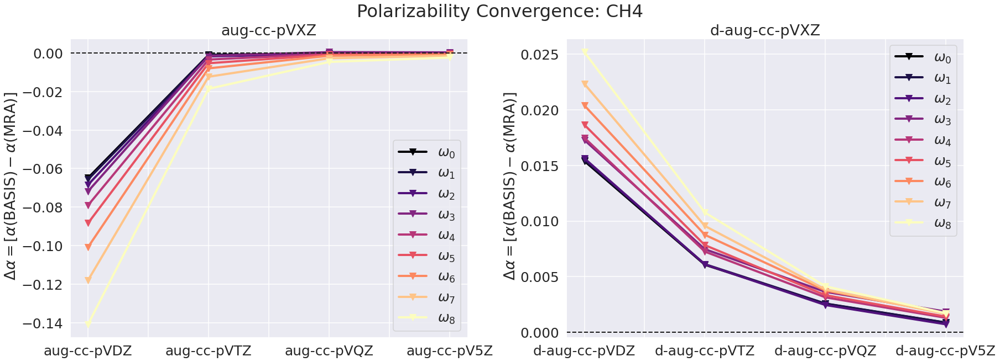

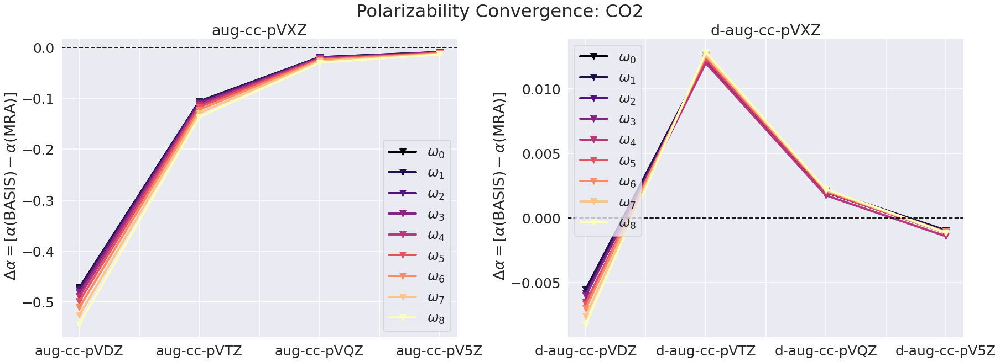

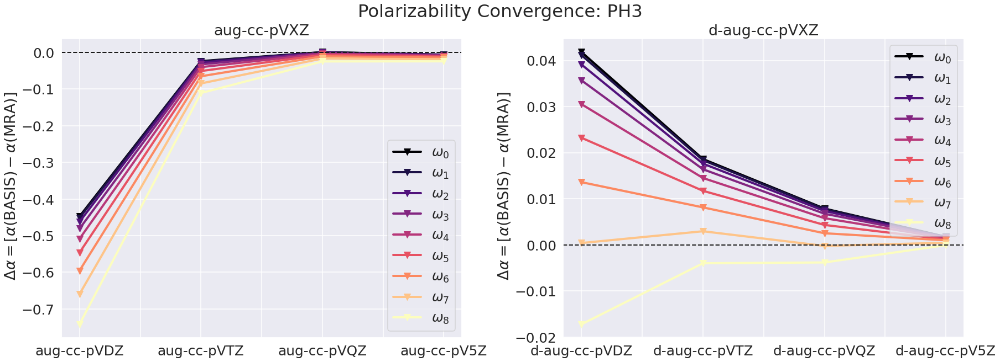

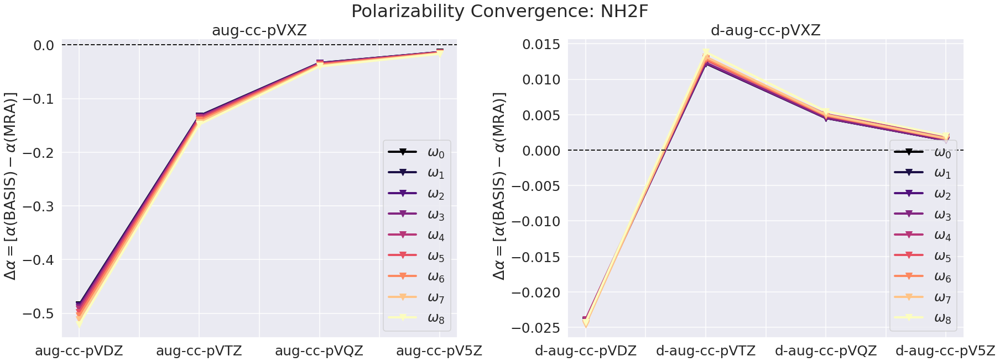

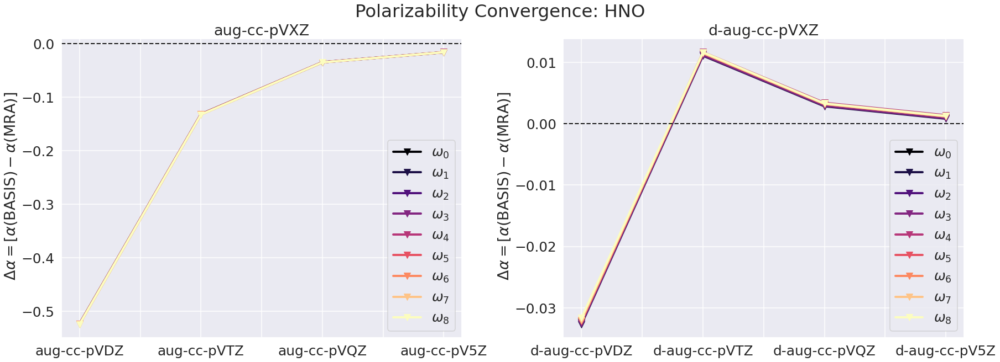

In [31]:
subset=data3.loc[data3['basis']=='d-aug-cc-pVQZ']
from_above=list(subset.loc[subset[data_keys[2]]>0].molecule.values)

for mol in from_above:
    f=create_polar_diff_subplot(mol,blist5,dlist5)
    f.savefig('acs_plots_new/'+mol+'.svg')

In [32]:
from_above

['C2H2',
 'HCN',
 'CH3OH',
 'C2H4',
 'SO2',
 'HNC',
 'F2',
 'N2',
 'SiH4',
 'N2H2',
 'He',
 'OF2',
 'HCOOH',
 'Ne',
 'HCHO',
 'SiH3F',
 'CH2BH',
 'FNO',
 'H2O',
 'BHF2',
 'CO',
 'CH4',
 'CO2',
 'PH3',
 'NH2F',
 'HNO']

In [33]:
data4=create_basis_set_df(blist5+dlist5,from_above,9)


aug-cc-pVDZ
aug-cc-pVTZ
aug-cc-pVQZ
aug-cc-pV5Z
d-aug-cc-pVDZ
d-aug-cc-pVTZ
d-aug-cc-pVQZ
d-aug-cc-pV5Z


/tmp/ipykernel_164789/426774053.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2.loc[:,'basis']=base_vals
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 15.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 61.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 38.5% of the points cannot be placed; you may want to decrease th

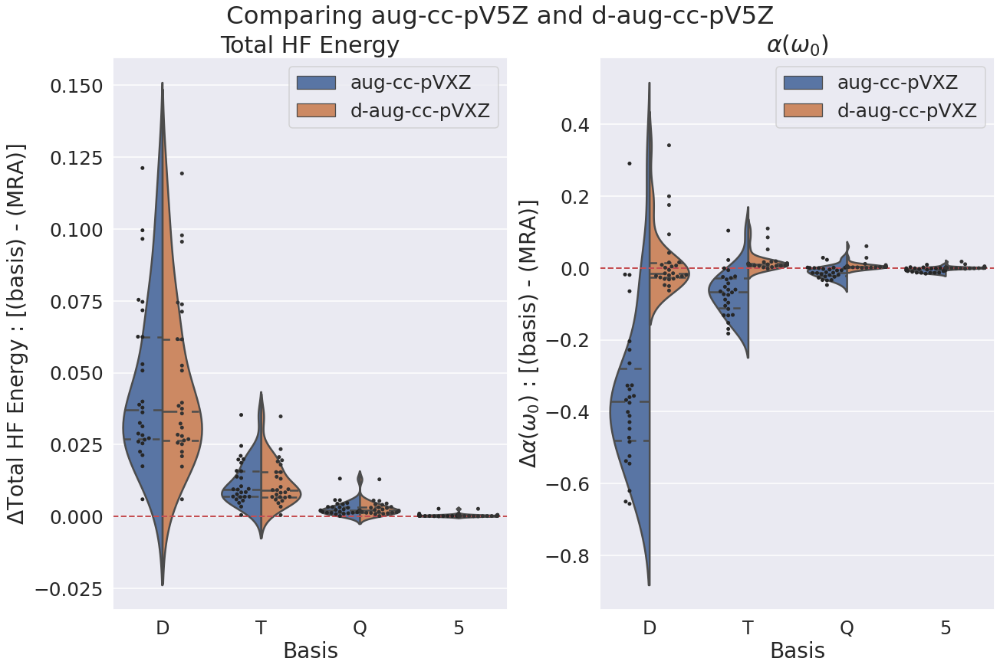

In [34]:
f1=augmentation_series_violin_plots(data4,blist5,dlist5)
f1.savefig('acs_plots_new/violin-from_above.svg')

/tmp/ipykernel_164789/426774053.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2.loc[:,'basis']=base_vals
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 45.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 5.7% of the points cannot be placed; you may want to decrease the

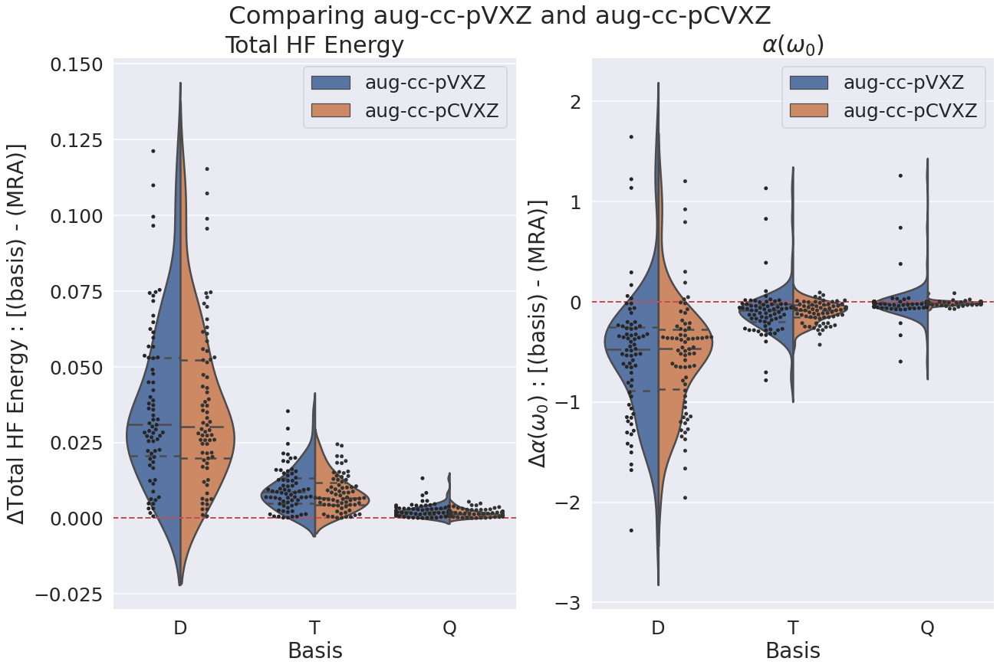

In [35]:

pc_aug_fig=polarization_series_violin_plots(data2,blist,pc_basis_list)
pc_aug_fig.savefig('acs_plots_new/violin_aug_polarized_core.svg')


/tmp/ipykernel_10415/426774053.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2.loc[:,'basis']=base_vals
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 47.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/adrianhurtado/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the

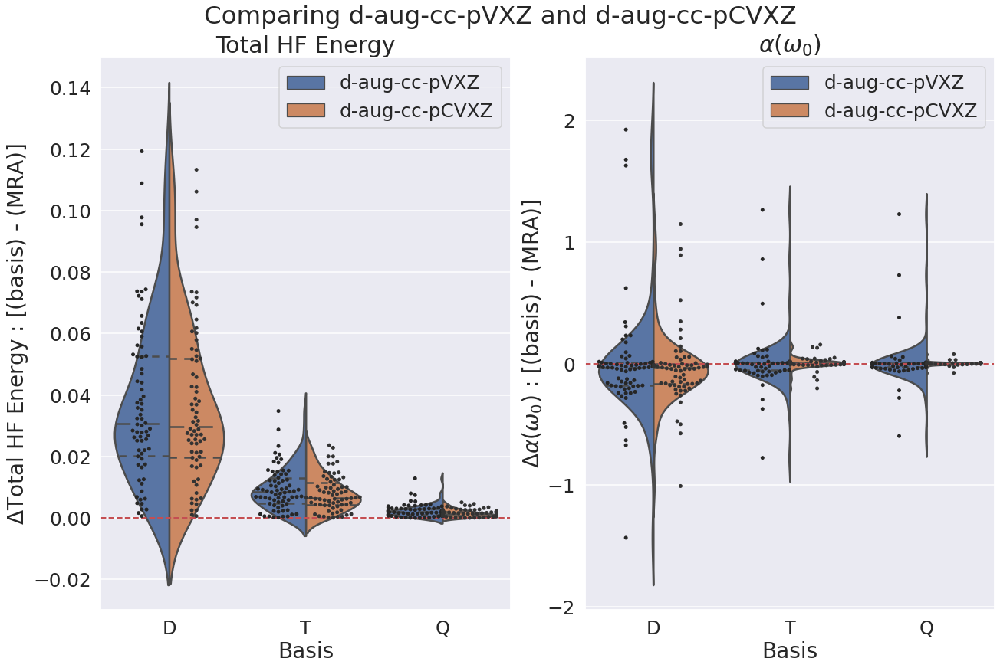

In [48]:

pc_aug_fig=polarization_series_violin_plots(data2,dlist,dpc_basis_list)
pc_aug_fig.savefig('acs_plots_new/violin_daug_polarized_core.svg')

In [36]:
# plottting and dataframes related to std and mean of data
def mean_std_basis(basis,data):
    
    dm=data.loc[data.basis==basis]
    basis_mean=dm.mean()
    basis_std=dm.std()
    
    return basis_mean,basis_std

def mean_std_basis_df(basis_list,data):
    
    mean_dict={}
    std_dict={}
    for basis in basis_list:
        
        [mean_dict[basis],std_dict[basis]]=mean_std_basis(basis,data)
    
    mean_df=pd.DataFrame(mean_dict)
    std_df=pd.DataFrame(std_dict)
    
    polar_mean=mean_df.loc[mean_df.index[1:]]
    polar_std=std_df.loc[std_df.index[1:]]
    
    total_e_mean=mean_df.loc[mean_df.index[0:1]]
    total_e_std=std_df.loc[std_df.index[0:1]]
    
    return polar_mean,polar_std,total_e_mean,total_e_std


def plot_total_energy_basis_statistics(basis_list,total_e_mean,total_e_std):
    
    fig=plt.figure(constrained_layout=True,figsize=(20,10))
    fig.suptitle('Basis-Set Convergence')
    
    subfig=fig.subplots(nrows=1,ncols=2)
    
    axleft=subfig[0]
    axright=subfig[1]
    
    total_e_mean[basis_list].T.plot(ax=axleft,marker='*',title='Error in Total Energy')
    total_e_std[basis_list].T.plot(ax=axright,marker='*',title='Standard Error in Total Energy')



In [37]:

def plot_stat(basis_list,data,data_title,ax):
    
    num_freq=len(list(data[basis_list].index))
    omega_label=[]
    for i in range(num_freq):
        #omega_label.append(r'$\omega_{}$'.format(i))
        omega_label.append(str(i))
        
    data[basis_list].plot(ax=ax,marker='o',title=data_title,lw=4,ms=20)
    xticks=[f for f in range(num_freq)]
    ax.set_xticks(xticks,labels=omega_label)
    ax.set_xlabel(r'$\omega_i$')
    
    if data_title=='Mean Error':
        ax.set_ylabel(r'$\Delta \alpha(\omega_i)$')
    elif data_title=='Standard Deviation Error':
        ax.set_ylabel(r'$\sigma$')
    
    ax.axhline(y=0,c='k',linestyle='--')
    
    return None

def plot_basis_statistic(basis_list,polar_mean,polar_std,data_name):
    
    sns.set_theme(style="darkgrid")
    sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})
    btitle=basis_list[0].replace('D','X')

    fig=plt.figure(constrained_layout=True,figsize=(20,10))
    fig.suptitle(r'Error in $\alpha(\omega)$: '+btitle+' '+data_name)
    subfig=fig.subplots(nrows=1,ncols=2)
    axleft=subfig[0]
    axright=subfig[1]
    
    plot_stat(basis_list,polar_mean,'Mean Error',axleft)
    plot_stat(basis_list,polar_std,'Standard Deviation Error',axright)
    
    return fig
    
def create_basis_stat_plot(blist,data,data_name):
    polar_mean,polar_std,total_e_mean,total_e_std=mean_std_basis_df(blist,data)
    return plot_basis_statistic(blist,polar_mean,polar_std,data_name) 



/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

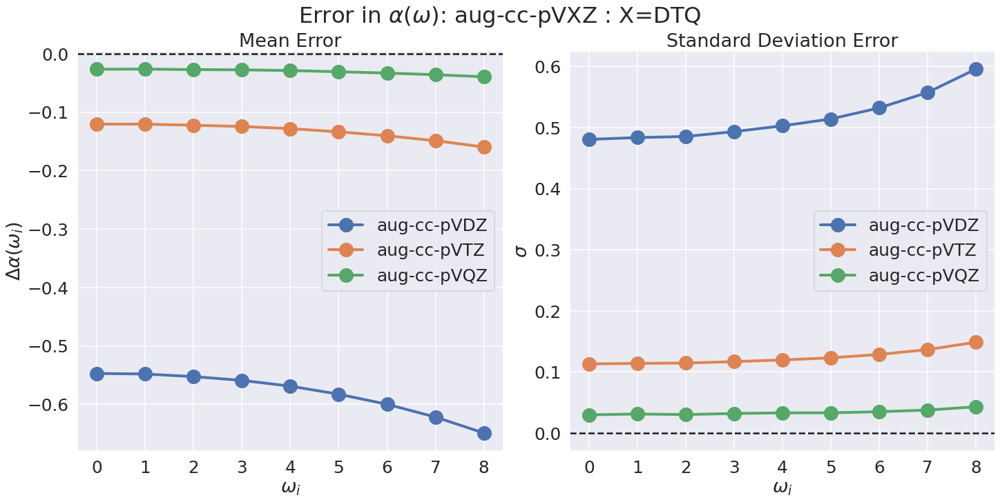

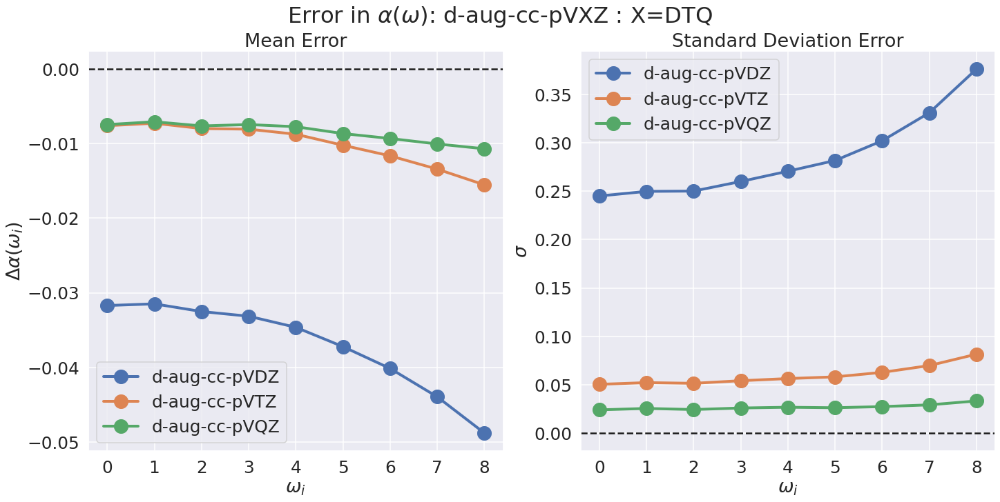

In [38]:

f=create_basis_stat_plot(blist,data1_keep,': X=DTQ')
f.savefig('acs_plots_new/freq_full_aug.svg')
f=create_basis_stat_plot(dlist,data1_keep,': X=DTQ')
f.savefig('acs_plots_new/freq_full_daug.svg')

/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

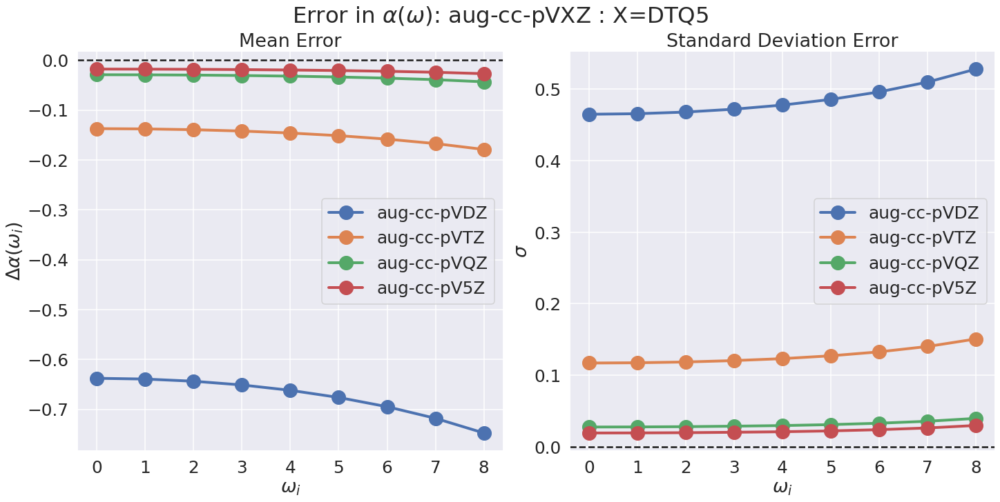

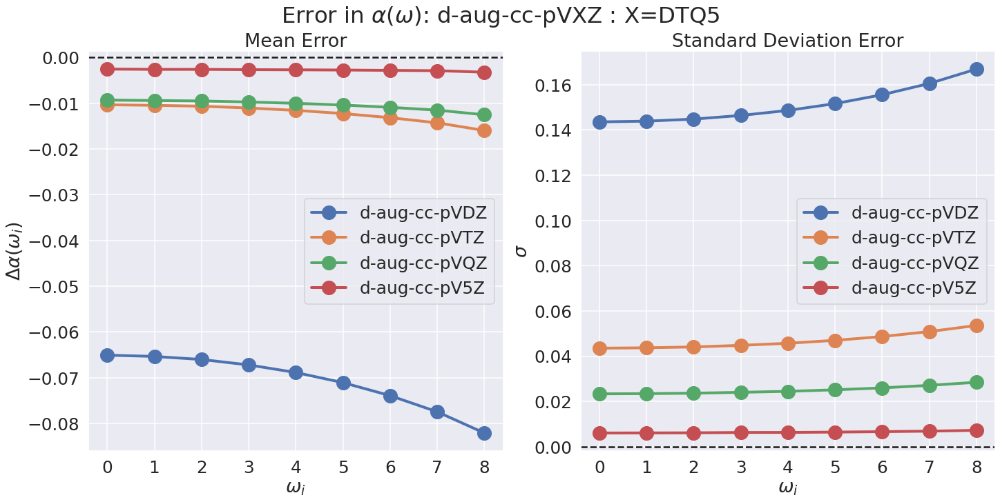

In [39]:

f=create_basis_stat_plot(blist5,data3,': X=DTQ5')
f.savefig('acs_plots_new/freq_5_aug.svg')
f=create_basis_stat_plot(dlist5,data3,': X=DTQ5')
f.savefig('acs_plots_new/freq_5_daug.svg')


/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

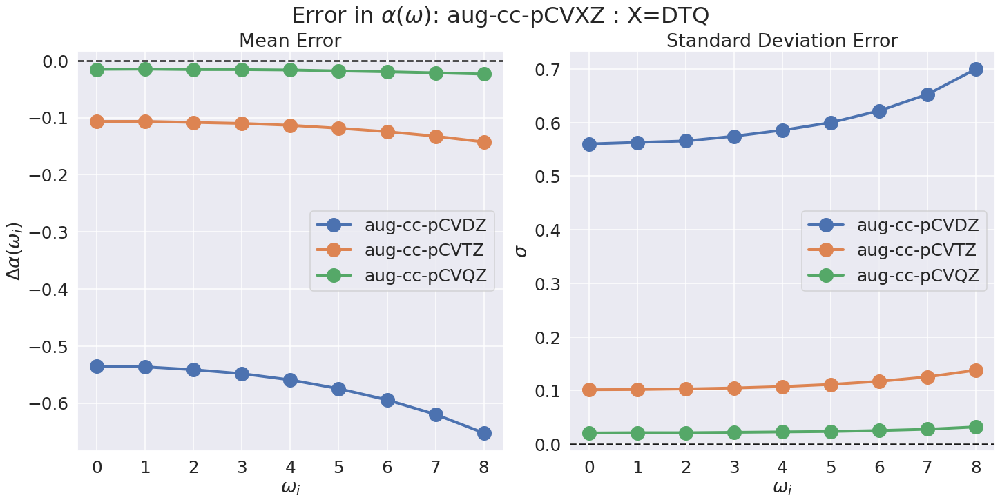

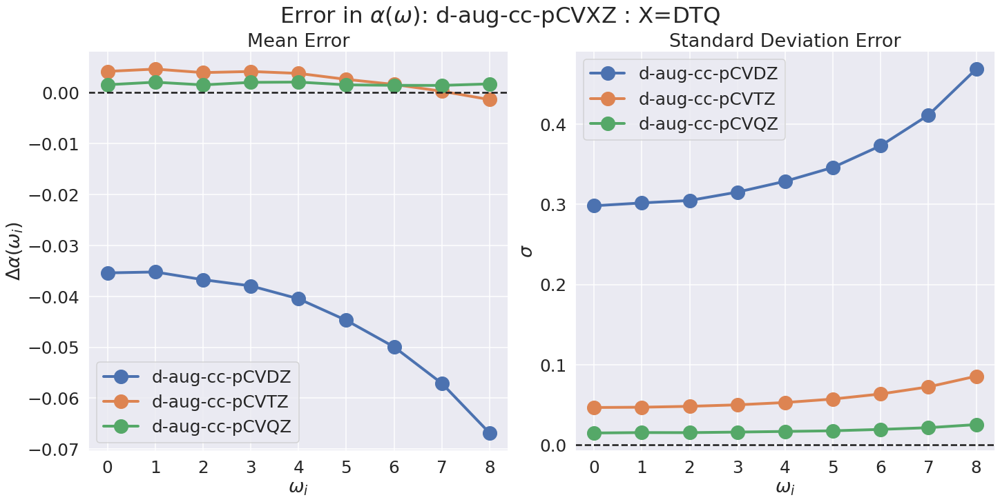

In [40]:

f=create_basis_stat_plot(pc_basis_list,data2,': X=DTQ')
f.savefig('acs_plots_new/freq_pc_aug.svg')
f=create_basis_stat_plot(dpc_basis_list,data2,': X=DTQ')
f.savefig('acs_plots_new/freq_pc_daug.svg')

In [46]:

def plot_freq_stat(basis_list,data,data_title,ax):
    
    num_freq=len(list(data[basis_list].index))
    omega_label=[]
    for i in range(num_freq):
        omega_label.append(r'$\omega_{}$'.format(i))
        
    data[basis_list].T.plot(ax=ax,marker='o',title=data_title,lw=4,ms=20,colormap='magma')
    ax.set_xlabel(r'Basis')
    
    ax.legend(labels=omega_label)
    
    if data_title=='Mean Error':
        ax.set_ylabel(r'$\Delta \alpha(\omega_i)$')
    elif data_title=='Standard Deviation Error':
        ax.set_ylabel(r'$\sigma$')
    
    ax.axhline(y=0,c='k',linestyle='--')
    

def plot_basis_stat(basis_list,polar_mean,polar_std,data_name):
    
    btitle=basis_list[0].replace('D','X')
    fig=plt.figure(constrained_layout=True,figsize=(24,11))
    
    fig.suptitle(r'Error in $\alpha(\omega)$: '+btitle+' '+data_name)
    
    subfig=fig.subplots(nrows=1,ncols=2)
    
    axleft=subfig[0]
    axright=subfig[1]
    
    plot_freq_stat(basis_list,polar_mean,'Mean Error',axleft)
    plot_freq_stat(basis_list,polar_std,'Standard Deviation Error',axright)
    
    return fig

def create_basis_freq_plot(blist,data,data_name):
    polar_mean,polar_std,total_e_mean,total_e_std=mean_std_basis_df(blist,data)
    return plot_basis_stat(blist,polar_mean,polar_std,data_name) 


/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

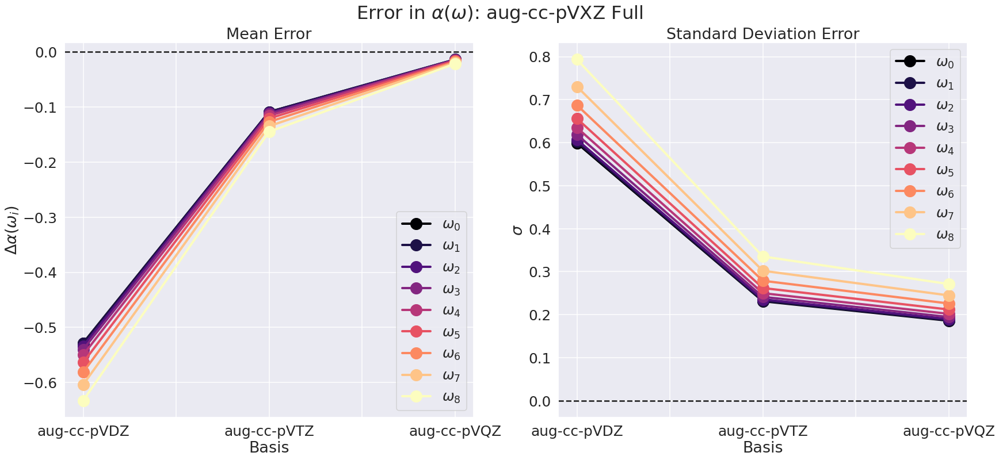

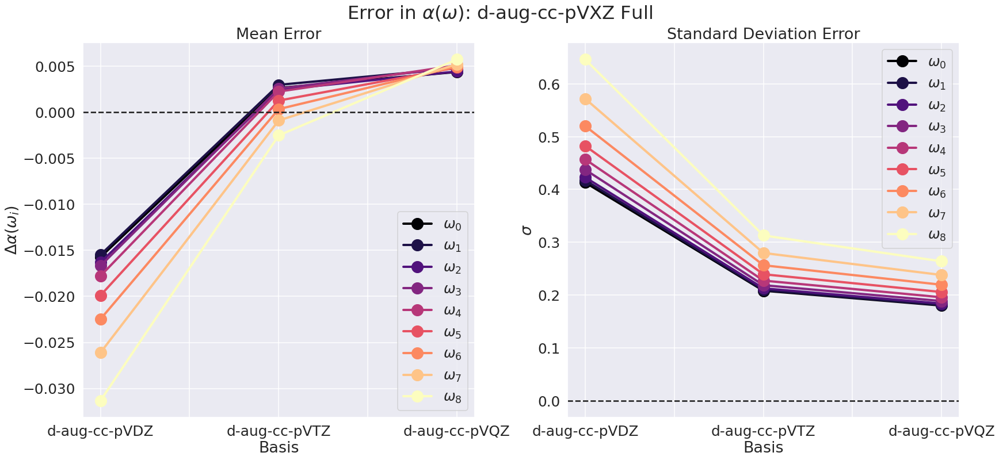

In [47]:

p1=create_basis_freq_plot(blist,data1,'Full') 
p1.savefig('acs_plots/aug_error_full.svg')

p1=create_basis_freq_plot(dlist,data1,'Full') 
p1.savefig('acs_plots/daug_error_full.svg')



/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

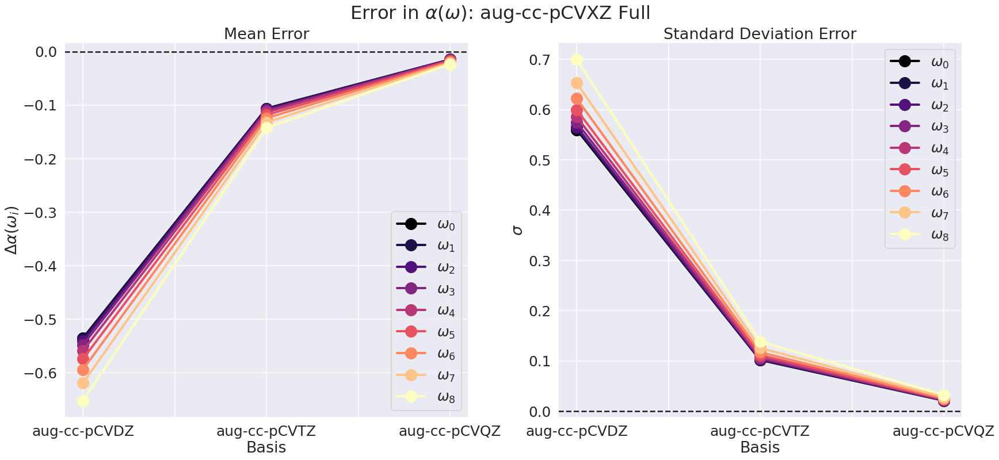

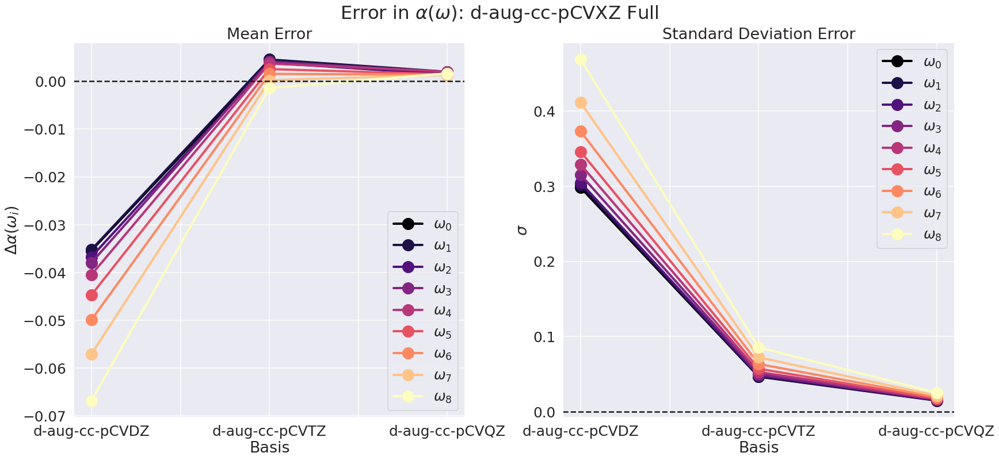

In [48]:
#data2=create_basis_set_df(blist+dlist+pc_basis_list+dpc_basis_list,pc_mols,9)
#data3=create_basis_set_df(blist5+dlist5,dz5_mol,9)

p1=create_basis_freq_plot(pc_basis_list,data2,'Full') 
p1.savefig('acs_plots/pc_freq_error.svg')

p1=create_basis_freq_plot(dpc_basis_list,data2,'Full') 
p1.savefig('acs_plots/dpc_freq_error.svg')

/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_std=dm.std()
/tmp/ipykernel_164789/2328044337.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  basis_mean=dm.mean()
/tmp/ipykernel_164789/2328044337.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this 

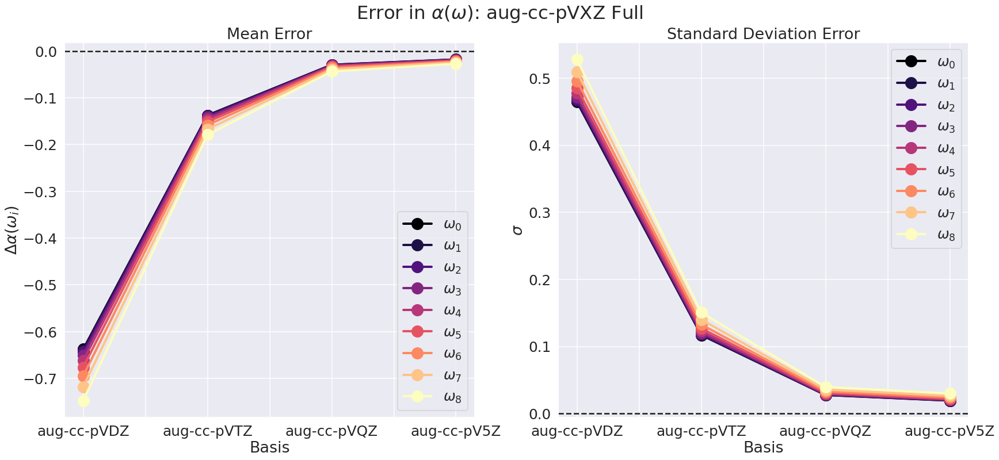

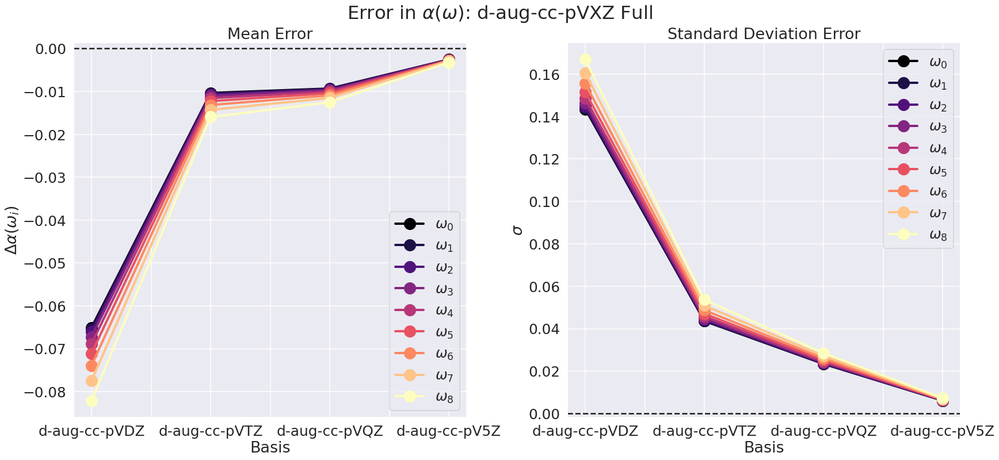

In [49]:

p1=create_basis_freq_plot(blist5,data3,'Full') 
p1.savefig('acs_plots/b5_freq_error.svg')

p1=create_basis_freq_plot(dlist5,data3,'Full') 
p1.savefig('acs_plots/d5_freq_error.svg')

In [60]:
def get_walltime_data(mol,xc,operator):
    
    data=FrequencyData(mol,'hf','dipole')
    n_mo=data.calc_info['calcinfo_nalpha']
    g_time=data.calc_info['wall_time']
    wall_times=[]
    frequencies=[]
    for freq,base in data.response_base.items():
        frequencies.append(freq)
        wall_times.append(base['wall_time'])
        
    wall_array=np.array(wall_times)
    total_time=wall_array[-1]
    total_time+=g_time
    print(n_mo,' electrons, walltime: ',total_time)
    return n_mo, total_time



In [61]:

get_walltime_data('Be','hf','dipole')


2  electrons, walltime:  1437.9646728038788


(2, 1437.9646728038788)

In [62]:
def get_wall_time_series(molecules,xc,operator):
    
    wall_time_data={}
    molecule_data={}
    for mol in molecules:
        n,time=get_walltime_data(mol,xc,operator)
        nkey=(n)
        if nkey not in wall_time_data:
            wall_time_data[nkey]=[]
            wall_time_data[nkey].append(time)
        else:
            wall_time_data[nkey].append(time)
        if nkey not in molecule_data:
            molecule_data[nkey]=[]
            molecule_data[nkey].append(mol)
        else:
            molecule_data[nkey].append(mol)
    wall_time_avg_data={}
    for n,time_list in wall_time_data.items():
        time_array=np.array(time_list)
        time_avg=time_array.sum()
        wall_time_avg_data[n]=time_avg
    time_series=pd.Series(wall_time_avg_data)
    mol_data=pd.Series(molecule_data)
    
    return time_series.sort_index(),mol_data.sort_index()

In [63]:
time_data,mol_index=get_wall_time_series(converged,converged,'dipole')

15  electrons, walltime:  135262.0842256546
2  electrons, walltime:  4144.015033006668
11  electrons, walltime:  122015.74550700188
17  electrons, walltime:  70110.17595028877
21  electrons, walltime:  135129.40636610985
2  electrons, walltime:  5084.569533109665
9  electrons, walltime:  153948.55095863342
3  electrons, walltime:  15654.63997888565
14  electrons, walltime:  149395.95679616928
7  electrons, walltime:  32879.61557507515
4  electrons, walltime:  13053.922852993011
12  electrons, walltime:  61251.26139688492
13  electrons, walltime:  138302.04830503464
15  electrons, walltime:  391993.2593727112
12  electrons, walltime:  174388.9296658039
12  electrons, walltime:  71803.10215210915
7  electrons, walltime:  74913.78386688232
9  electrons, walltime:  122995.12910699844
11  electrons, walltime:  28188.978957891464
8  electrons, walltime:  76754.56744623184
16  electrons, walltime:  533180.5163891315
7  electrons, walltime:  47650.44617819786
11  electrons, walltime:  146442.6

<AxesSubplot:>

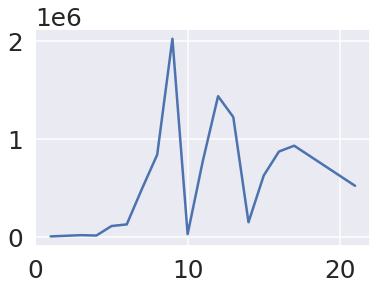

In [64]:
time_data.plot()

In [ ]:
data=Fre